In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline


## No Batch Norm

In [2]:
import os 

GPUID='2'
os.environ['CUDA_VISIBLE_DEVICES']=GPUID

In [3]:
import sys
import datetime
import uuid
from itertools import chain
#export
import time
#pip3 install psutil
import psutil

from exp.nb_formatted import *

In [4]:
device = torch.device(f"cuda:{GPUID}" if torch.cuda.is_available() else "cpu")
print(device)

cuda:2


In [5]:
torch.cuda.empty_cache()

In [6]:
# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

In [7]:
#set to true on first run
RETRAIN=True
#set to false if just want to plot saved model data
REFIT=True
#max mem use for weights in GB in RAM:
MAX_MEM=40
#compress layer weights down to this size for visualisation
REBIN_SHAPE=(64,64)
#save very compressed weights for plots
SAVE_COMPRESSED_WTS=True
#
GRAD_SCALAR=42

In [8]:
pid = os.getpid()
py = psutil.Process(pid)
memoryUse = py.memory_info()[0] / 2. ** 30
print('memory use:', memoryUse)

memory use: 2.390064239501953


In [9]:
#base, shallow, deep
HOOK_DEPTH = 'base'
CURRENT_DATE = datetime.datetime.today().strftime('%Y%m%d')
UID=str(uuid.uuid4())[:8]
NAME=HOOK_DEPTH+'_'+CURRENT_DATE+'_'+UID+'_'+GPUID+'_no_BN'

In [10]:
NAME

'base_20190624_6868d367_2_no_BN'

In [167]:
pt_wts='nbn_iw5'

In [11]:
#keep track of index and layer type
INDEX_DICT={}

In [12]:
cwd=os.getcwd()
IMG_PATH=os.path.abspath(cwd + "/images/")

In [13]:
IMG_PATH

'/mnt/963GB/Data/Python/Courses/my_fastai/2019_pt2_dev_course/dl2/images'

In [14]:
torch.cuda.empty_cache()

## Serializing the model

Store on ssd rather than in home folder

In [15]:
path = datasets.untar_data(datasets.URLs.IMAGEWOOF_160, dest='data')

In [16]:
size = 128
bs = 64
#bs = 512

tfms = [make_rgb, RandomResizedCrop(size, scale=(0.35,1)), np_to_float, PilRandomFlip()]
val_tfms = [make_rgb, CenterCrop(size), np_to_float]
il = ImageList.from_files(path, tfms=tfms)
sd = SplitData.split_by_func(il, partial(grandparent_splitter, valid_name='val'))
ll = label_by_func(sd, parent_labeler, proc_y=CategoryProcessor())
ll.valid.x.tfms = val_tfms
data = ll.to_databunch(bs, c_in=3, c_out=10, num_workers=8)

In [17]:
len(il)

12954

In [18]:
loss_func = LabelSmoothingCrossEntropy()
opt_func = adam_opt(mom=0.9, mom_sqr=0.99, eps=1e-6, wd=1e-2)

Using imagenette norm on imagewoof

In [19]:
learn = cnn_learner(arch=nbnresnet18, data=data, loss_func=loss_func, opt_func=opt_func, norm=norm_imagenette)

In [20]:
def sched_1cycle(lr, pct_start=0.3, mom_start=0.95, mom_mid=0.85, mom_end=0.95):
    phases = create_phases(pct_start)
    sched_lr  = combine_scheds(phases, cos_1cycle_anneal(lr/10., lr, lr/1e5))
    sched_mom = combine_scheds(phases, cos_1cycle_anneal(mom_start, mom_mid, mom_end))
    return [ParamScheduler('lr', sched_lr),
            ParamScheduler('mom', sched_mom)]

In [21]:
lr = 3e-3
pct_start = 0.5
cbsched = sched_1cycle(lr, pct_start)

save out model so can use with pets

1 x 2080ti, bs=256, epochs=10, elapsed: 115.17198395729065

2 x 2080ti, bs=512, epochs=10, elapsed: 79.39946436882019

In [22]:
mdl_path = path/'models'
mdl_path.mkdir(exist_ok=True)

In [23]:
#absolute path
HOOK_PATH=mdl_path/NAME
if SAVE_COMPRESSED_WTS:
    HOOK_PATH.mkdir(exist_ok=True)

In [24]:
if RETRAIN:
    start=time.time()
    #learn.model = torch.nn.DataParallel(learn.model, device_ids=[0,1, 2])
    learn.fit(40, cbsched)
    end=time.time()
    print(f'elapsed: {end-start}')
    st = learn.model.state_dict()

    print(type(st))

    #keys are names of the layers
    print(', '.join(st.keys()))
    print(path)

    #It's also possible to save the whole model, including the architecture, 
    #but it gets quite fiddly and we don't recommend it. 
    #Instead, just save the parameters, and recreate the model directly.

    torch.save(st, mdl_path/'nbn_iw5')
else:
    print('Loading pre-trained model weights')
    learn.model.load_state_dict(torch.load(mdl_path/pt_wts))
    st = learn.model.state_dict()
    print(st['10.bias'])

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,2.715940,0.273005,2.302634,0.094000,00:10
1,2.376136,0.091617,2.302722,0.100000,00:09
2,2.287571,0.135458,6.493663,0.100000,00:09
3,2.206911,0.240405,11.431659,0.100000,00:09
4,2.041804,0.496467,12.145078,0.100000,00:09
5,2.089556,0.333547,3.067434,0.100000,00:09
6,1.823612,0.343344,4.499188,0.100000,00:09
7,1.583456,0.441545,5.400989,0.100000,00:09
8,1.480793,0.464188,5.500470,0.100000,00:09
9,1.410651,0.536454,4.218770,0.100000,00:09


elapsed: 396.62214732170105
<class 'collections.OrderedDict'>
0.0.weight, 1.0.weight, 2.0.weight, 4.0.convs.0.0.weight, 4.0.convs.1.0.weight, 4.1.convs.0.0.weight, 4.1.convs.1.0.weight, 5.0.convs.0.0.weight, 5.0.convs.1.0.weight, 5.0.idconv.0.weight, 5.1.convs.0.0.weight, 5.1.convs.1.0.weight, 6.0.convs.0.0.weight, 6.0.convs.1.0.weight, 6.0.idconv.0.weight, 6.1.convs.0.0.weight, 6.1.convs.1.0.weight, 7.0.convs.0.0.weight, 7.0.convs.1.0.weight, 7.0.idconv.0.weight, 7.1.convs.0.0.weight, 7.1.convs.1.0.weight, 10.weight, 10.bias
data/imagewoof-160


## Pets

In [25]:
pets = datasets.untar_data(datasets.URLs.PETS, dest='data')

In [26]:
pets.ls()

[PosixPath('data/oxford-iiit-pet/annotations'),
 PosixPath('data/oxford-iiit-pet/images')]

In [27]:
pets_path = pets/'images'

In [28]:
il = ImageList.from_files(pets_path, tfms=tfms)

In [29]:
il

ImageList (7390 items)
[PosixPath('data/oxford-iiit-pet/images/scottish_terrier_193.jpg'), PosixPath('data/oxford-iiit-pet/images/Bengal_173.jpg'), PosixPath('data/oxford-iiit-pet/images/boxer_147.jpg'), PosixPath('data/oxford-iiit-pet/images/pug_137.jpg'), PosixPath('data/oxford-iiit-pet/images/german_shorthaired_54.jpg'), PosixPath('data/oxford-iiit-pet/images/Ragdoll_88.jpg'), PosixPath('data/oxford-iiit-pet/images/english_setter_120.jpg'), PosixPath('data/oxford-iiit-pet/images/great_pyrenees_120.jpg'), PosixPath('data/oxford-iiit-pet/images/British_Shorthair_212.jpg'), PosixPath('data/oxford-iiit-pet/images/leonberger_155.jpg')...]
Path: data/oxford-iiit-pet/images

We dont have a sapratae validation directory so randomly grab val samples

In [30]:
#export
def random_splitter(fn, p_valid): return random.random() < p_valid

In [31]:
random.seed(42)

In [32]:
sd = SplitData.split_by_func(il, partial(random_splitter, p_valid=0.1))

In [33]:
sd

SplitData
Train: ImageList (6667 items)
[PosixPath('data/oxford-iiit-pet/images/scottish_terrier_193.jpg'), PosixPath('data/oxford-iiit-pet/images/boxer_147.jpg'), PosixPath('data/oxford-iiit-pet/images/pug_137.jpg'), PosixPath('data/oxford-iiit-pet/images/german_shorthaired_54.jpg'), PosixPath('data/oxford-iiit-pet/images/Ragdoll_88.jpg'), PosixPath('data/oxford-iiit-pet/images/english_setter_120.jpg'), PosixPath('data/oxford-iiit-pet/images/British_Shorthair_212.jpg'), PosixPath('data/oxford-iiit-pet/images/chihuahua_132.jpg'), PosixPath('data/oxford-iiit-pet/images/staffordshire_bull_terrier_59.jpg'), PosixPath('data/oxford-iiit-pet/images/chihuahua_127.jpg')...]
Path: data/oxford-iiit-pet/images
Valid: ImageList (723 items)
[PosixPath('data/oxford-iiit-pet/images/Bengal_173.jpg'), PosixPath('data/oxford-iiit-pet/images/great_pyrenees_120.jpg'), PosixPath('data/oxford-iiit-pet/images/leonberger_155.jpg'), PosixPath('data/oxford-iiit-pet/images/Siamese_84.jpg'), PosixPath('data/oxfor

Now need to label - use filenames as cant use folders

In [34]:
n = il.items[0].name; n

'scottish_terrier_193.jpg'

In [35]:
re.findall(r'^(.*)_\d+.jpg$', n)[0]

'scottish_terrier'

In [36]:
def pet_labeler(fn): 
    return re.findall(r'^(.*)_\d+.jpg$', fn.name)[0]

Use CategoryProcessor from last week

In [37]:
proc = CategoryProcessor()

In [38]:
ll = label_by_func(sd, pet_labeler, proc_y=proc)

In [39]:
', '.join(proc.vocab)

'scottish_terrier, boxer, pug, german_shorthaired, Ragdoll, english_setter, British_Shorthair, chihuahua, staffordshire_bull_terrier, Maine_Coon, pomeranian, american_pit_bull_terrier, yorkshire_terrier, Bengal, saint_bernard, Birman, Abyssinian, Bombay, Siamese, keeshond, beagle, american_bulldog, shiba_inu, wheaten_terrier, leonberger, basset_hound, great_pyrenees, japanese_chin, Russian_Blue, Sphynx, havanese, Egyptian_Mau, english_cocker_spaniel, samoyed, newfoundland, miniature_pinscher, Persian'

In [40]:
ll.valid.x.tfms = val_tfms

In [41]:
c_out = len(proc.vocab)

### turn off shuffle 

Dont want shuffling of data at every epoch so can analyze parameter differences across epochs

In [42]:
data = ll.to_databunch(bs, c_in=3, c_out=c_out, num_workers=8, shuffle=False)

In [43]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func, norm=norm_imagenette)

In [44]:
if RETRAIN:
    learn.fit(5, cbsched)

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,5.744003,0.024899,3.612639,0.024896,00:06
1,3.611317,0.024149,3.611655,0.020747,00:06
2,3.611663,0.028499,3.612505,0.020747,00:06
3,3.611539,0.023999,3.612863,0.017981,00:06
4,3.610893,0.027299,3.612921,0.023513,00:06


<pre>
epoch 	train_loss 	train_accuracy 	valid_loss 	valid_accuracy 	time
0 	3.467661 	0.083246 	3.488343 	0.095436 	00:07
1 	3.303485 	0.126594 	3.571582 	0.112033 	00:07
2 	3.123925 	0.179691 	3.204137 	0.159059 	00:07
3 	2.826835 	0.265037 	2.929686 	0.250346 	00:07
4 	2.544567 	0.360582 	2.638438 	0.355463 	00:07
</pre>

#### weights and stat functions

histc()

Computes the histogram of a tensor.
        
        The elements are sorted into equal width bins between :attr:`min` and
        :attr:`max`. If :attr:`min` and :attr:`max` are both zero, the minimum and
        maximum values of the data are used.

In [45]:
#create a global in the __main__ scope so we can track iterations
stat_iter = 0

In [46]:
#with code from https://gist.github.com/derricw/95eab740e1b08b78c03f
def bin_ndarray(ndarray, new_shape, operation='mean'):
    """
    re-bins a batch of weigths to new_shape and takes means
    """
    assert operation.lower() in ['sum', 'mean']
    if type(ndarray) is not np.ndarray:
        ndarray=ndarray.cpu().numpy()
    try:
        ndarray=ndarray.reshape((-1,REBIN_SHAPE[0]))
    except (RuntimeError,ValueError) as e:
        redim=(int(ndarray.size/REBIN_SHAPE[0]),REBIN_SHAPE[0])
        #incompatible size, coerce it to fit
        ndarray = np.resize(ndarray,redim)
    if ndarray.shape[0]<new_shape[0]:
        #eg if Linear layer with less classes than requred dimension, then pad with zeros
        b = ndarray.transpose().copy()
        b.resize(new_shape, refcheck=False)
        ndarray = b.transpose()
    cp = [(d, c//d) for d, c in zip(new_shape, ndarray.shape)]
    flattened = [l for p in cp for l in p]
    try:
        ndarray = np.reshape(ndarray,flattened)
    except (RuntimeError,ValueError) as e:
        #incompatible size, coerce it to fit
        ndarray = np.resize(ndarray,flattened)
    for i in range(len(new_shape)):
        if operation.lower() == "sum":
            ndarray = ndarray.sum(-1*(i+1))
        elif operation.lower() == "mean":
            ndarray = ndarray.mean(-1*(i+1))
    return ndarray


In [47]:
def append_hist_stats(hook, mod, inp, outp):
    '''Note that the hook is a different instance for each layer type
    ie XResNet has its own hook object, AdaptiveConcatPool2d has its own hook object etc
    '''
    if not hasattr(hook,'stats'): 
        hook.stats = ([],[],[])
    means,stds,hists = hook.stats
    if mod.training:
        #eg outp.data shape is [64,512,4,4]
        #print(f"{str(mod).split('(')[0]} shape: {outp.data.shape}")
        means.append(outp.data.mean().cpu())
        stds.append(outp.data.std().cpu())
        if isinstance(mod, nn.Linear):
            hists.append(outp.data.cpu().histc(40,-10,10)) #no relu here
        else:
            hists.append(outp.data.cpu().histc(40,0,10)) #no negatives

In [48]:
def append_hist_rebinned_stats(hook, mod, inp, outp):
    '''Note that the hook is a different instance for each layer type
    ie XResNet has its own hook object, AdaptiveConcatPool2d has its own hook object etc
    '''
    if not hasattr(hook,'stats'): 
        hook.stats = ([],[],[])
    #richer storage than just means but down want to store all data
    if not hasattr(hook,'bins'): 
        hook.bins = ([])
    means,stds,hists = hook.stats
    rebinned = hook.bins
    if mod.training:
        #eg outp.data shape is [64,512,4,4]
        #print(f"{str(mod).split('(')[0]} shape: {outp.data.shape}")
        means.append(outp.data.mean().cpu())
        stds.append(outp.data.std().cpu())
        if isinstance(mod, nn.Linear):
            hists.append(outp.data.cpu().histc(40,-10,10)) #no relu here
        else:
            hists.append(outp.data.cpu().histc(40,0,10)) #no negatives
        rebinned.append(bin_ndarray(outp.data.cpu(), REBIN_SHAPE, operation='mean'))

In [49]:
def write_index_file(data, file_name):
    with open(file_name, 'w') as f:
        print(data, file=f)

In [50]:
#saving weights to disk for later calcs (too much for RAM)
def append_hist_stats_save(hook, mod, inp, outp):
    global stat_iter
    append_hist_stats(hook, mod, inp, outp)
    if mod.training:
        INDEX_DICT[stat_iter]=str(mod).split('(')[0]
        SHAPE_DICT[stat_iter]=str(list(outp.data.size()))
        np.save(f'{HOOK_DATA_PATH}/{stat_iter}.npy', outp.data.cpu())
        stat_iter+=1

In [51]:
#needs work before can use - far too much data to store in RAM without downsampling
def append_raw_hist_stats(hook, mod, inp, outp):
    global stat_iter
    memoryUse=0
    if not hasattr(hook,'stats'): 
        hook.stats = ([],[],[])
    if not hasattr(hook,'raws'): 
        hook.raws = ([])
    means,stds,hists = hook.stats
    raws = hook.raws
    if mod.training:
        #eg outp.data shape is [64,512,4,4]
        means.append(outp.data.mean().cpu())
        stds.append(outp.data.std().cpu())
        if (stat_iter % 100) == 0:
            memoryUse = py.memory_info()[0] / 2. ** 30
        if memoryUse < MAX_MEM:
            d = outp.data
            if len(outp.data.shape)==4:
                new_shape=outp.data.shape
                #want 3 channels so can plot r,g,b
                new_shape[-1]=3
                #put channel as last dimension
                d=d.permute(0, 2, 3, 1)
                d=d.cpu().numpy()
                #calc mean of the whole batch
                d=d.mean(0)
                #now coerce to 3 channels
                d=bin_ndarray(d, new_shape, operation='mean')
            #flatten and linear are dim 2 
            #now take mean over last index to reduce size
            else:
                d=d.cpu().numpy()
            raws.append(d.mean(-1))
            if stat_iter==0:
                print(f'data shape: {outp.data.cpu().numpy().shape}, size: {outp.data.cpu().numpy().size}, mean size: {outp.data.cpu().numpy().mean(-1).size}')
        else:
            print(f'oom appending: {outp.data.cpu().numpy().mean(-1).size}, {outp.data.cpu().numpy().shape}')
        if isinstance(mod, nn.Linear):
            hists.append(outp.data.cpu().histc(40,-10,10)) #no relu here
        else:
            hists.append(outp.data.cpu().histc(40,0,10)) #no negatives
        if stat_iter<100:
            print(f'iter: {stat_iter}, layer: {mod.__class__.__name__}, data shape: {outp.data.cpu().numpy().shape}')
        stat_iter+=1

In [52]:
def read_index_file(model_path, index_file):
    print(f'>>calc_hook_deltas {model_path}/{index_file}')
    data = None
    s = open(f'{model_path}/{index_file}', 'r').read()
    data = eval(s)
    data = collections.OrderedDict(sorted(data.items()))
    return data

In [53]:
def read_hist_stats(file_name):
    array_reloaded = np.load(file_name)
    array_reloaded=torch.from_numpy(array_reloaded).float().to(device)
    return array_reloaded
    

In [54]:
def get_k_by_v(d, val):
    keys = []
    for key, value in d.items():
        if value == val:
            keys.append(key)
    #print(f'val: {val}, len(keys): {len(keys)}')
    return keys 

In [55]:
#see chris albon
def chunks(l, n):
    # For item i in a range that is a length of l,
    for i in range(0, len(l), n):
        # Create an index range for l of n items:
        yield l[i:i+n]

In [56]:
def get_base_hist(data):
    t=torch.stack(data).t().float().log1p().cpu()
    #print(f'stack shape: {t.size()}')
    return t

In [57]:
#get the hist data at index 2
def get_hist(h): 
    assert len(h.stats)==3
    return get_base_hist(h.stats[2])


In [58]:
def diff_stats(hooks_data):
    #diff calculates the n-th order discrete difference along given axis(defaut is last).
    histsl=[]
    msl=[]
    ssl=[]
    for h in hooks_data:
        histsl.append(np.diff(get_hist(h)))
        ms,ss, hists = h.stats
        msl.append(np.diff(ms))
        ssl.append(np.diff(ss))
    return msl,ssl, histsl

In [59]:
def diff_stats_axis0(hooks_data):
    #calculate the n-th order discrete difference along first axis-between batches.
    histsl=[]
    msl=[]
    ssl=[]
    for h in hooks_data:
        histsl.append(np.diff(get_hist(h), axis=0))
        ms,ss, hists = h.stats
        msl.append(np.diff(ms, axis=0))
        ssl.append(np.diff(ss, axis=0))
    return msl,ssl, histsl

In [60]:
def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

In [61]:
def get_start_mins(h):
    h1 = torch.stack(h.stats[2]).t().float().cpu()
    return h1[:2].sum(0)/h1.sum(0)

In [62]:
def get_mid_mins(h, max_hist):
    h1 = torch.stack(h.stats[2]).t().float().cpu()
    #get stats on middle bins of histogram data
    return h1[int((max_hist/2)-1):int((max_hist/2)+2)].sum(0)/h1.sum(0)

In [63]:
#intra batch histogram difference
def delta_hists(data):
    diff_data=[]
    for h in data:
        diff_data.append(np.diff(get_hist(h)))
    return diff_data

In [64]:
#batch to batch histogram difference
def delta_bb_hists(data):
    diff_bb_data=[]
    for h in data:
        diff_bb_data.append(np.diff(get_hist(h), axis=0))
    return diff_bb_data

In [65]:
#eg learn.grad_rebinned
def get_stacked_diff_grads(grad_rebinned):
    bdelts=[]
    for l in grad_rebinned:
        a = np.vstack(l)
        a=np.diff(a)
        bdelts.append(a)
    return bdelts

In [66]:
#eg learn.grad_rebinned
def get_stacked_grads(grad_rebinned, scalar=0):
    #can remove GRAD_SCALAR applied if required
    b=[]
    for l in grad_rebinned:
        a = np.vstack(l)
        b.append(a-scalar)
    return b

#### Gradients

In [67]:
class GradsCallback(Callback):
    def __init__(self):
        self.grad_hists = []
        self.rebinned_grads = []
        self.epoch_hists = []
        self.epoch_rebin_grads = []

    def after_backward(self):
        batch_hists=[]
        batch_grads=[]
        for param in self.run.model.parameters():
            #gradients will be +ve and -ve, so we add a scalar that we can back out later
            r = torch.add(param.data, GRAD_SCALAR)
            n=r.flatten().cpu().numpy()
            batch_grads.append(n)
            
            h = param.data.histc(100, -1, 1).cpu().numpy()
            batch_hists.append(h)
        #dont want the Linear and pre-linear layers
        self.grad_hists.append(batch_hists[:-2])
        p=np.asarray(batch_grads[:-2])
        #stack the arrays in sequence horizontally with hstack rather than flatten as different sizes
        p=np.hstack(p)
        #smash grads down to REBIN_SHAPE*REBIN_SHAPE so are managable
        b=bin_ndarray(p, REBIN_SHAPE, operation='mean')
        self.rebinned_grads.append(b)

    def after_epoch(self):
        self.epoch_hists.append(self.grad_hists.copy())
        self.epoch_rebin_grads.append(self.rebinned_grads.copy())
        self.grad_hists = []
        self.rebinned_grads=[]
 
    def after_fit(self):
        #monkey patch into model so can access from program
        self.run.grad_hists=self.epoch_hists.copy()
        self.run.grad_rebinned=self.epoch_rebin_grads.copy()
        self.epoch_hists=[]
        self.epoch_rebin_grads=[]

## Custom head

Poor result above, here we read in imagewoof model and customise for pets. Create 10 activations at end.

Also addpend Recorder callback to access loss

In [68]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func, c_out=10, norm=norm_imagenette, xtra_cb=[Recorder, GradsCallback])

In [69]:
mdl_path

PosixPath('data/imagewoof-160/models')

In [78]:
st = torch.load(mdl_path/pt_wts)

In [79]:
#st.keys()

In [80]:
m = learn.model

In [81]:
mst = m.state_dict()

In [82]:
#mst.keys()

In [83]:
#check that keys are same in both dicts

In [84]:
[k for k in st.keys() if k not in mst.keys()]

[]

In [85]:
m.load_state_dict(st)

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

In [86]:
#want to remove last layer as have different ammount of categries - here 37 pet breeds. Find the AdaptiveAvgPool2d layer and use everything before this

In [87]:
m

NBNResNet(
  (0): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): ReLU(inplace)
  )
  (1): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU(inplace)
  )
  (2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): ReLU(inplace)
  )
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): NBNResBlock(
      (convs): Sequential(
        (0): Sequential(
          (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): ReLU(inplace)
        )
        (1): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
      )
    )
    (1): NBNResBlock(
      (convs): Sequential(
        (0): Sequential(
          (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
       

In [88]:
cut = next(i for i,o in enumerate(m.children()) if isinstance(o,nn.AdaptiveAvgPool2d))
m_cut = m[:cut]

In [89]:
len(m_cut)

8

In [90]:
def module_grandchildren(model):
    grandkids=[]
    for m in m_cut.children():
        for g in m.children():
            grandkids.append(g)
    return grandkids

In [91]:
m_gc = module_grandchildren(m_cut)

In [92]:
xb,yb = get_batch(data.valid_dl, learn)

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time


>>1335 Recorder.begin_fit()


In [93]:
pred = m_cut(xb)

In [94]:
pred.shape

torch.Size([128, 512, 4, 4])

To find number of inputs, here we have 128 minibatch of input size 512, 4x4

In [95]:
#number of inputs to our head
ni = pred.shape[1]

Note we use both Avg and Max pool and concatenate them together eg
https://www.cs.cmu.edu/~tzhi/publications/ICIP2016_two_stage.pdf

In [96]:
#export
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=1):
        super().__init__()
        self.output_size = sz
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

In [97]:
nh = 40

### plotting functions

In [98]:
def reshape_h_data(hook_d):
    reshaped=[]
    for d in hook_d:
        h_bins = d.bins
        data=np.vstack(h_bins) 
        reshaped.append(data)
    return reshaped

In [99]:
def plot_bins(hooks, model_summary, batch_max=True, scalar=0.5, cmap=plt.cm.nipy_spectral, fig_name=None):
    '''Takes list of 2d arrays (compressed weights), resizes for plot
        eg layer: Conv2d, len: 105 
        vstack shape: (6720, 64) 
        reshape: (840, 512) 
        layer: Relu, len: 1995 
        vstack shape: (127680, 64) 
        reshape: (15960, 512) 
        NB for plt.subplots layout is nrows x ncols'''
    if len(hooks)>11:
        fig, axes = plt.subplots(int(len(hooks)/10), int(len(hooks)/2), figsize=(20, len(hooks)*1.5))
    else:
        fig, axes = plt.subplots(1, len(hooks), figsize=(20, 18))
    #global min/max for model
    gmin=0
    gmax=0
    if batch_max:
        for d in hooks:
            vmin, vmax = d.min(), d.max()
            if vmin<gmin:
                gmin=vmin
            if vmax>gmax:
                gmax=vmax
    for data, ax, mod in zip(hooks, axes.ravel(), model_summary):
        try:
            data=data.reshape((-1,REBIN_SHAPE[0]*int(REBIN_SHAPE[0]/8)))
        except (RuntimeError,ValueError) as e:
            #redim=(int(data.size/REBIN_SHAPE[0]*int(REBIN_SHAPE[0]/8)),REBIN_SHAPE[0]*int(REBIN_SHAPE[0]/8))
            redim=(int(data.size/REBIN_SHAPE[0]*int(REBIN_SHAPE[0]/8)/8),int(REBIN_SHAPE[0]*int(REBIN_SHAPE[0]/8)*8))
            data = np.resize(data,redim)
        if not batch_max:
            gmin, gmax = data.min(), data.max()
        mn=round(np.mean(data), 2)
        st=round(np.std(data), 2)
        # use global min / max to ensure all weights are shown on the same scale
        #jet is OK but nipy better
        ax.matshow(data, cmap=cmap, vmin=scalar * gmin,
                       vmax=scalar * gmax, alpha=0.8)
        ax.set_xticks(())
        ax.set_yticks(())
        ax.title.set_text(mod)
        #add mean and std deviation of plot data
        ax.text(0.5,-0.1, str(mn)+' '+str(st), size=8, ha="center", 
         transform=ax.transAxes)
    
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

    

In [100]:
def plot_rasters(data, size):
    fig, axes = plt.subplots(4, 4)
    # use global min / max to ensure all weights are shown on the same scale
    vmin, vmax = data.min(), data.max()
    #for coef, ax in zip(data.T, axes.ravel()):
    for coef, ax in zip(data, axes.ravel()):
        ax.matshow(coef.reshape(size), cmap=plt.cm.jet, vmin=.5 * vmin,
                   vmax=.5 * vmax)
        ax.set_xticks(())
        ax.set_yticks(())

    plt.show()

In [101]:
def plot_hooks(hooks, model, fig_name=None):
    fig,(ax0,ax1) = plt.subplots(1,2, figsize=(10,4))
    print(f'plotting {len(hooks)} layers')
    i=0
    first_len=0
    for h,m in zip(hooks,model):
        ms,ss, hists = h.stats
        if i==0:
            first_len=len(ms)
        #print(f"{i}, {str(m).split('(')[0]}: {len(ms)}")
        if str(m).split('(')[0]=='ReLU':
        #data for Relu layer is 19 times longer than other layers, not sure why
            ms=ms[:first_len] 
            ss=ss[:first_len] 
        ax0.plot(ms)
        ax0.set_title('mean')
        ax1.plot(ss)
        ax1.set_title('std. dev.')
        i+=1
    if model:   
        titles=[]
        idxs=[]
        for j,m in enumerate(learn.model):
            titles.append(str(j)+' '+str(m).split('(')[0])
        plt.legend(titles, bbox_to_anchor=(1.04,1), loc="upper left")
    else:
        plt.legend(range(len(hooks)), bbox_to_anchor=(1.04,1), loc="upper left")
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [102]:
def plot_hooks_hist(hooks, fig_name=None, model=None):
    #subplots(rows,colums)
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*3))
    i=0
    for ax,h in zip(axes.flatten(), hooks):
        ax.imshow(get_hist(h), origin='lower')
        ax.imshow(get_hist(h))
        ax.set_aspect('auto')
        ax.axis('on')
        if model:
            for j,m in enumerate(learn.model):
                if i == j:
                    title=str(m).split('(')[0]
                    ax.set_title(title)
        i+=1
    plt.tight_layout()
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [103]:
def plot_hooks_hist_diffs(hooks, cmap=plt.cm.viridis, norm=False, fig_name=None, model=None):
    #TODO merge with plot_hooks_hist
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*3))
    i=0
    normalize = mpl.colors.Normalize(vmin=-1, vmax=1)
    for ax,h in zip(axes.flatten(), hooks):
        if norm:
            ax.imshow(h, cmap=cmap, norm=normalize, origin='lower')
            ax.imshow(h, cmap=cmap, norm=normalize)
        else:
            ax.imshow(h, cmap=cmap, origin='lower')
            ax.imshow(h, cmap=cmap)
        ax.set_aspect('auto')
        ax.axis('on')
        if model:
            for j,m in enumerate(learn.model):
                if i == j:
                    title=str(m).split('(')[0]
                    ax.set_title(title)
        i+=1
    plt.tight_layout()
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [104]:
def plot_hooks_hist_diff_lines(hooks, fig_name=None, model=None):
    #TODO merge with plot_hooks_hist
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*3))
    i=0
    for ax,h in zip(axes.flatten(), hooks):
        ax.plot(h)
        if model:
            for j,m in enumerate(learn.model):
                if i == j:
                    title=str(m).split('(')[0]
                    ax.set_title(title)
        i+=1
    plt.tight_layout()
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [105]:
def plot_grad_hist(grad_list, full_model, fig_name=None):
    #subplots(rows,colums)
    layer_data={}
    for e,epoch in enumerate(grad_list):
        for b,batch in enumerate(epoch):
            for l,layer in enumerate(batch):
                #histogram tensor here
                layer_data.setdefault(l,[]).append(layer)
    half_plots=int((len(layer_data)/2) + (len(layer_data)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(18,int(len(layer_data)/2)*3))
    i=0
    for ax,ld in zip(axes.flatten(), layer_data.values()):
        ax.imshow(get_base_hist(ld), origin='lower')
        ax.imshow(get_base_hist(ld))
        ax.set_aspect('auto')
        ax.axis('on')
        for j,m in enumerate(full_model):
            if i == j:
                ax.set_title(m)
        i+=1
    plt.tight_layout()
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [106]:
def plot_hooks_hist_lines(hooks, fig_name=None):
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*5))
    for ax,h in zip(axes.flatten(), hooks):
        ax.plot(get_hist(h))
        ax.axis('on')
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [107]:
def plot_mins(hooks):
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*2))
    for ax,h in zip(axes.flatten(), hooks):
        ax.plot(get_start_mins(h))
        ax.set_ylim(0,1)
        ax.axis('on')
    plt.tight_layout()
    plt.legend(['start'])

In [108]:
def plot_mid_mins(hooks):
    half_plots=int((len(hooks)/2) + (len(hooks)/2 % 1 > 0))
    fig,axes = plt.subplots(half_plots,2, figsize=(15,int(len(hooks)/2)*2))
    hist = get_hist(hooks[0])
    max_hist=hist.shape[0]
    print(max_hist)
    for ax,h in zip(axes.flatten(), hooks):
        ax.plot(get_mid_mins(h,max_hist))
        ax.set_ylim(-1,1)
        ax.axis('on')
    plt.tight_layout()
    plt.legend(['mid'])

In [109]:
def plot_ep_vals(ep_vals, fig_name=None):
    plt.ylabel("loss")
    plt.xlabel("epoch")
    epochs = ep_vals.keys()
    plt.xticks(np.asarray(list(epochs)))
    trn_losses = [item[0] for item in list(ep_vals.values())]
    val_losses = [item[1] for item in list(ep_vals.values())]
    plt.plot(epochs, trn_losses, c='b', label='train')
    plt.plot(epochs, val_losses, c='r', label='validation')
    plt.legend(loc='upper left')
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [110]:
def plot_raw_layers(hooks):
    for h in hooks:
        print(len(h.raws))
        h_raw_np=np.concatenate(h.raws, axis=0 )
        plot_kernels(h_raw_np)

In [111]:
def plot_deltas(deltas, smoother, fig_name=None):
    half_plots=int((len(deltas)/2) + (len(deltas)/2 % 1 > 0))
    fig,axes= plt.subplots(half_plots,2, figsize=(10,half_plots*2))
    for ax,h in zip(axes.flatten(), deltas):
        h = smooth(h, smoother)
        ax.plot(h)
        ax.set_title('delta')
    plt.legend(range(len(deltas)))
    if fig_name:
        plt.savefig(IMG_PATH+'/'+NAME+'_'+fig_name)
    plt.show()

In [112]:
def get_model_layer_list(model):
    mdl=[]
    for mod in model:
        mdl.append(str(mod).split('(')[0])
    return mdl

In [113]:
def plot_a_bin(hooks, model_summary, run=0, batch_max=True, scalar=0.5, cmap=plt.cm.nipy_spectral, fig_name=None):
    #global min/max for model
    d=hooks[run]
    for h in d:
        plt.plot(h)
    plt.show()

In [252]:
def plot_t_raster(data, pltrange=None, num_plots=10, cmap=plt.cm.jet):
    # use global min / max to ensure all weights are shown on the same scale
    print(f'min: {np.amin(data)}, max: {np.amax(data)}')
    if not pltrange:
        vmin, vmax = data.min(), data.max()
    else:
        vmin, vmax =pltrange[0],pltrange[1]
    try:
        d=data.reshape((-1,REBIN_SHAPE[0],REBIN_SHAPE[0]))
    except (RuntimeError,ValueError) as e:
        redim=(int(data.size/REBIN_SHAPE[0]),REBIN_SHAPE[0],REBIN_SHAPE[0])
        d = np.resize(data,redim)
    for i in range(num_plots):
        plt.matshow(d[i], cmap=cmap, vmin=.5 * vmin,
                       vmax=.5 * vmax)
        plt.title(f'plot {i} of {num_plots} from {d.shape[0]}')
    plt.show()

In [115]:
for i,m in enumerate(learn.model):
    print(f'i: {i}, model part: {m}')

i: 0, model part: Sequential(
  (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (1): ReLU(inplace)
)
i: 1, model part: Sequential(
  (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): ReLU(inplace)
)
i: 2, model part: Sequential(
  (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): ReLU(inplace)
)
i: 3, model part: MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
i: 4, model part: Sequential(
  (0): NBNResBlock(
    (convs): Sequential(
      (0): Sequential(
        (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): ReLU(inplace)
      )
      (1): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
    )
  )
  (1): NBNResBlock(
    (convs): Sequential(
      (0): Sequential(
        (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1)

## Naive Model 

Allow hook to access internals of XResNet by unpacking arg list

In [116]:
m_new = nn.Sequential(
    *m_cut.children(), AdaptiveConcatPool2d(), Flatten(),
    nn.Linear(ni*2, data.c_out))

In [117]:
m_new_deep = nn.Sequential(
    *m_gc, AdaptiveConcatPool2d(), Flatten(),
    nn.Linear(ni*2, data.c_out))

In [118]:
m_new_shallow = nn.Sequential(
    m_cut, AdaptiveConcatPool2d(), Flatten(),
    nn.Linear(ni*2, data.c_out))

In [119]:
if HOOK_DEPTH=='deep':
    learn.model = m_new_deep
elif HOOK_DEPTH=='base':
    learn.model = m_new
elif HOOK_DEPTH=='shallow':
    learn.model = m_new_shallow

In [120]:
len(learn.model)

11

When we ran telemetry previously in lesson 10 (nb 06), were were using a manually built model with 7 layers:

<pre>
    Sequential(
  (0): Sequential(
    (0): Conv2d(1, 8, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): ReLU()
  )
  (1): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (3): Sequential(
    (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
  )
  (4): AdaptiveAvgPool2d(output_size=1)
  (5): Lambda()
  (6): Linear(in_features=32, out_features=10, bias=True)
)
</pre>

Like the code below the AdaptiveAvgPool2d and Lambda (below we use Flatten) have the same output data-ie same plot

### Fit

[batch_size, channels, height, width]

<pre>
Learn.fit
    Learner.all_batches
        Learner.one_batch()
            def one_batch(self, i, xb, yb):
                #call model on a batch
                try:
                    self.iter = i
                    self.xb, self.yb = xb, yb
                    self("begin_batch")
                    #here is where we call Module.__call__
                    self.pred = self.model(self.xb)
                    self("after_pred")
                    self.loss = self.loss_func(self.pred, self.yb)
                    self("after_loss")
                    if not self.in_train:
                        return
                    self.loss.backward()
                    self("after_backward")
                    self.opt.step()
                    self("after_step")
                    self.opt.zero_grad()
                except CancelBatchException:
                    self("after_cancel_batch")
                finally:
                    self("after_batch")
            
                Module.__call__
                    result = self.forward(*input, **kwargs)
                    for hook in self._forward_hooks.values():
                        hook_result = hook(self, input, result)
                        ->runs the append_hists_stats() hook here
</pre>

In [121]:
if REFIT:
    with Hooks(learn.model, append_hist_rebinned_stats) as hooks_naive: 
        learn.fit(5, cbsched)
    hooks_naive_grad_rebinned=learn.grad_rebinned
    if SAVE_COMPRESSED_WTS:
        np.save(f'{HOOK_PATH}/hooks_naive.npy', hooks_naive)
        np.save(f'{HOOK_PATH}/hooks_naive_grad_rebinned', learn.grad_rebinned)
else:
    hooks_naive = np.load(f'{HOOK_PATH}/hooks_naive.npy')
    hooks_naive_grad_rebinned = np.load(f'{HOOK_PATH}/hooks_naive_grad_rebinned.npy')

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,3.611153,0.026099,3.612521,0.022130,01:15
1,3.608302,0.028499,3.608209,0.037344,01:15
2,3.608164,0.029849,3.606272,0.030429,01:16
3,3.589945,0.033298,3.578362,0.026279,01:15
4,3.558833,0.044248,3.560617,0.027663,01:15


>>1335 Recorder.begin_fit()


<pre>
epoch 	train_loss 	train_accuracy 	valid_loss 	valid_accuracy 	time
0 	2.852017 	0.287686 	2.486142 	0.387275 	00:08
1 	2.179299 	0.469177 	2.641399 	0.352697 	00:07
2 	2.030308 	0.531273 	2.449481 	0.413555 	00:07
3 	1.731837 	0.638368 	1.788130 	0.615491 	00:07
4 	1.465440 	0.747413 	1.599652 	0.690180 	00:07
</pre>

##### Plots

plotting 11 layers


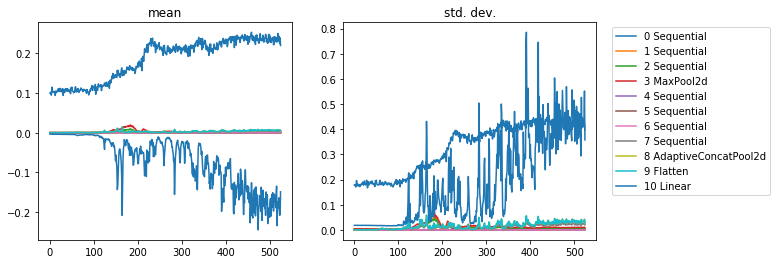

In [122]:
plot_hooks(hooks_naive,fig_name='naive_stats.png',model=learn.model)

In [123]:
type(hooks_naive)

exp.nb_formatted.Hooks

In [124]:
mod_summary=get_model_layer_list(learn.model)

In [125]:
h=reshape_h_data(hooks_naive)

In [126]:
h[0].shape

(33600, 64)

#### Plot binned (compressed) weights


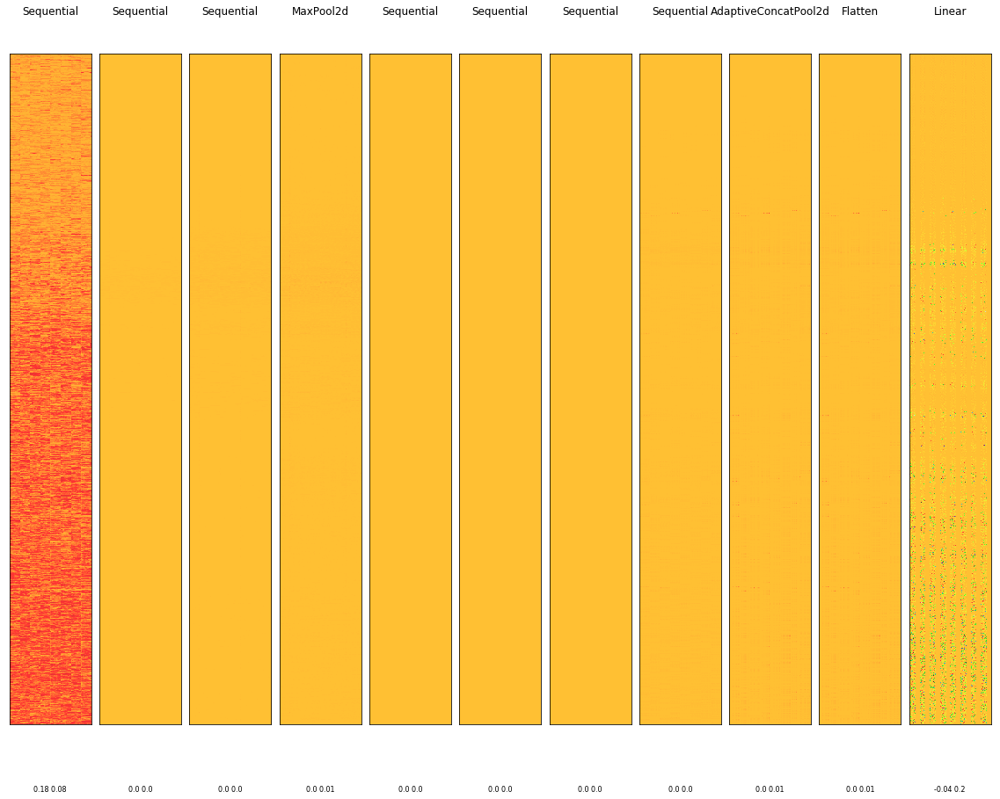

In [127]:
plot_bins(h, mod_summary, batch_max=True, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_naive_bmax.png')

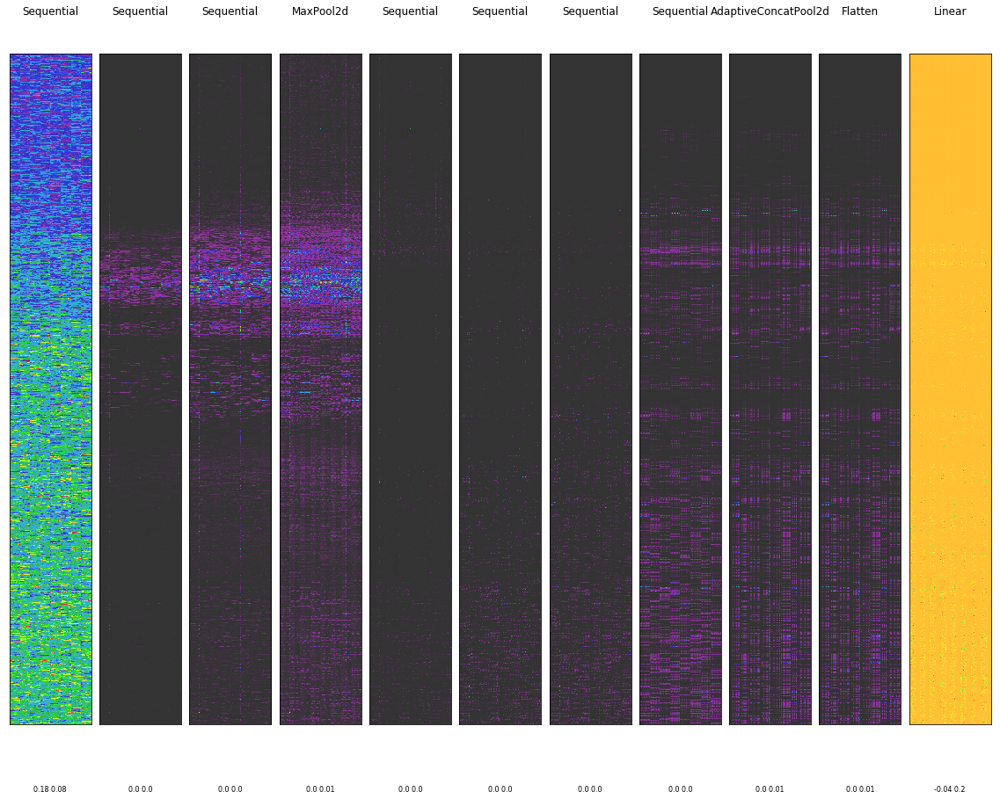

In [128]:
plot_bins(h, mod_summary, batch_max=False, scalar=0.8, cmap=plt.cm.nipy_spectral,fig_name='hooks_naive.png')

#### Gradients

In [257]:
b=get_stacked_grads(hooks_naive_grad_rebinned, GRAD_SCALAR)

In [130]:
plt_ttle=['epoch '+str(i) for i in range(5)]

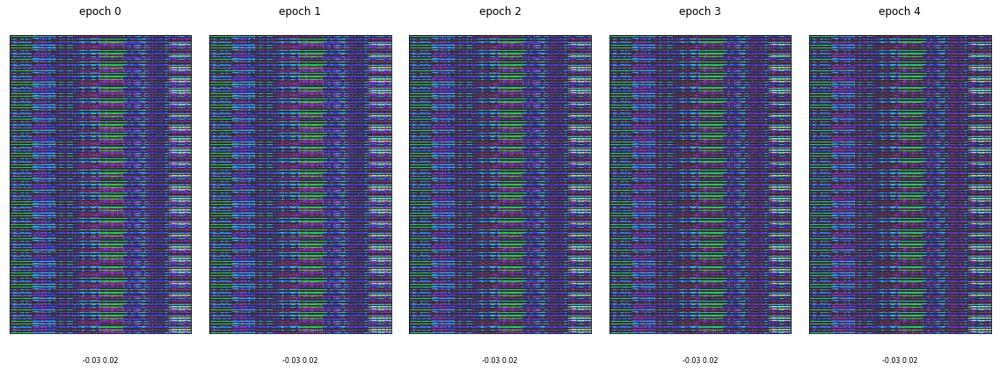

In [131]:
plot_bins(b, plt_ttle, batch_max=False, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_naive_grads.png')

### Batch plots

Each image below is a plot of one batch through full model.

Using jet colourmap (blue=low, red = high, light green in centre)

#### gradients for a batch



min: -0.0891265869140625, max: 0.047405242919921875


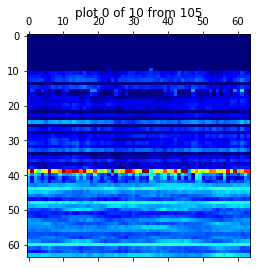

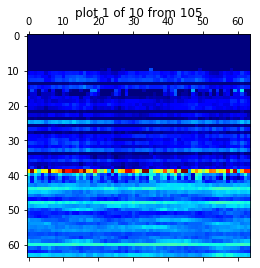

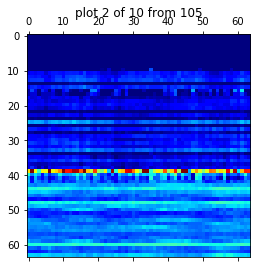

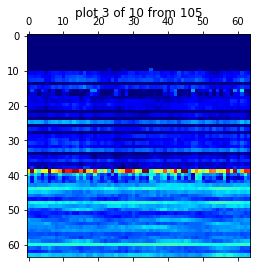

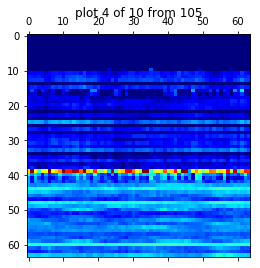

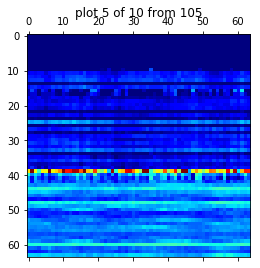

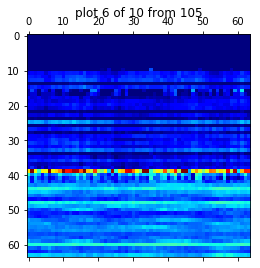

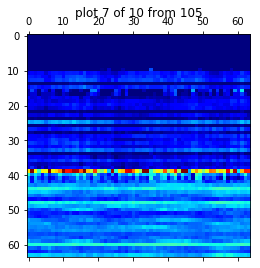

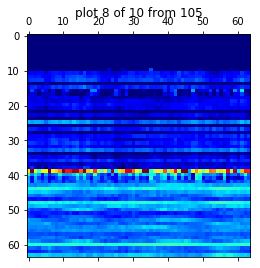

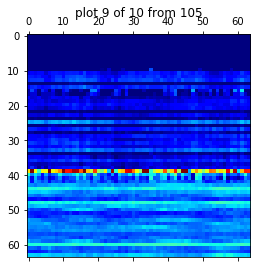

In [258]:
plot_t_raster(b[0], pltrange=(-0.06,0.06), cmap=plt.cm.jet)

In [133]:
d=np.diff(b[0])

#### delta grads

difference between gradients inside a batch 

min: -0.0427398681640625, max: 0.03990936279296875


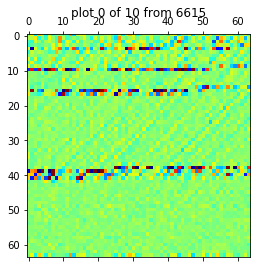

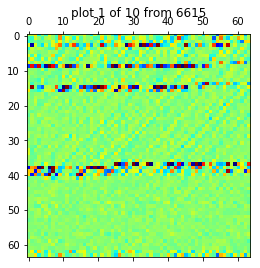

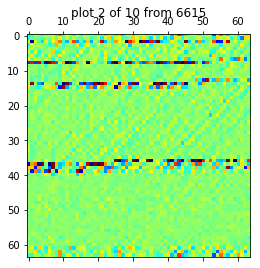

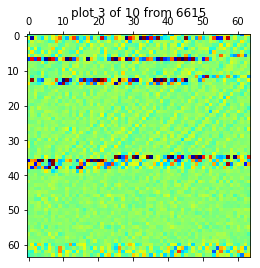

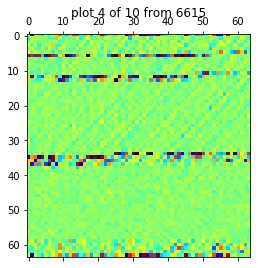

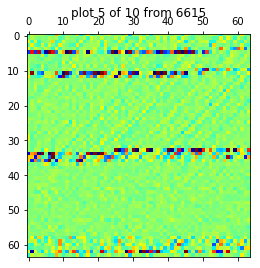

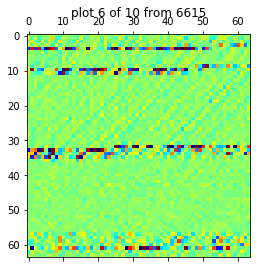

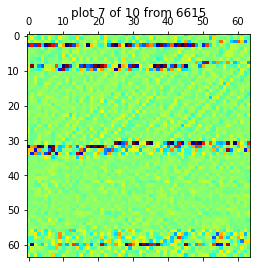

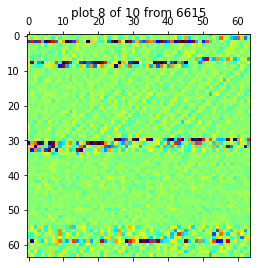

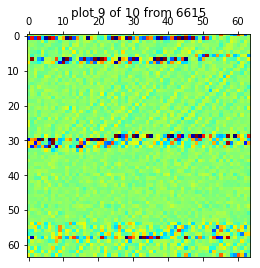

In [134]:

plot_t_raster(d)

#### delta grads

difference between gradients between batches

In [135]:
db=np.diff(b[0], axis=0)

min: -0.05956268310546875, max: 0.06812286376953125


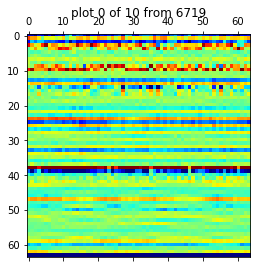

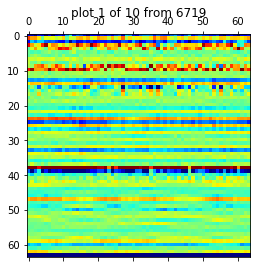

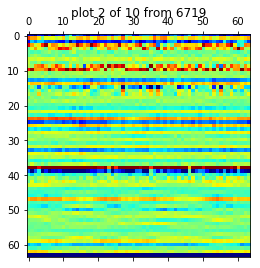

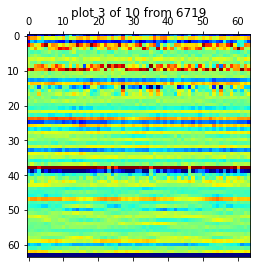

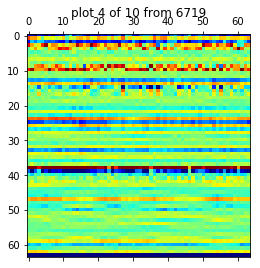

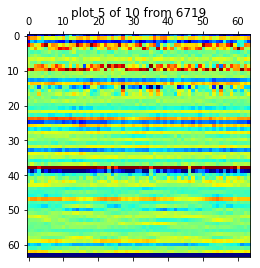

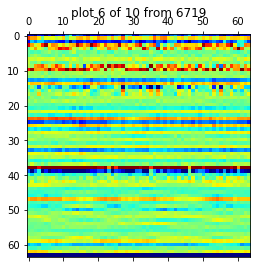

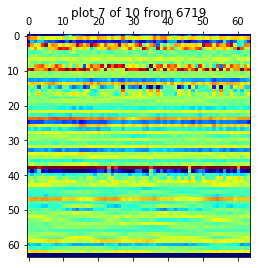

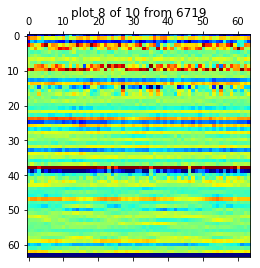

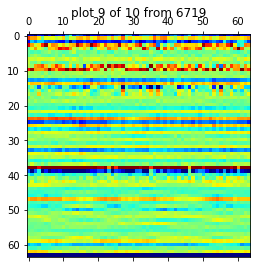

In [255]:
plot_t_raster(db, pltrange=(-0.06,0.06), cmap=plt.cm.jet)

#### batch weights

min: 0.0027001802809536457, max: 0.677467405796051


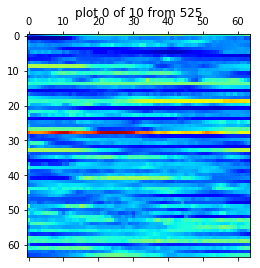

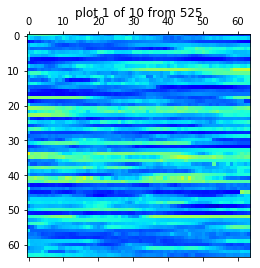

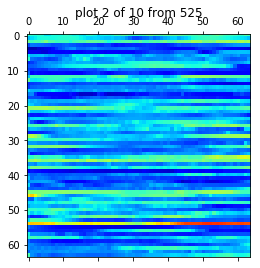

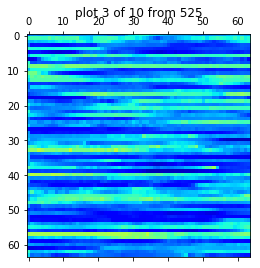

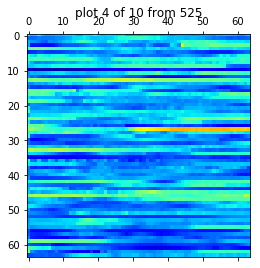

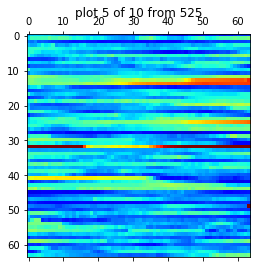

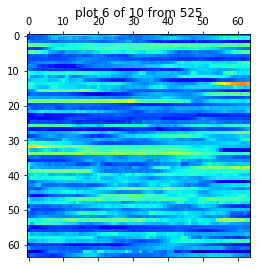

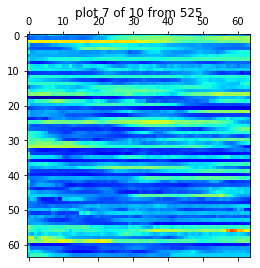

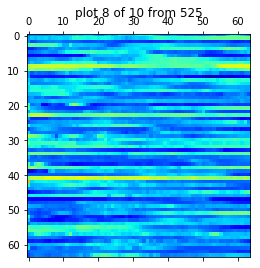

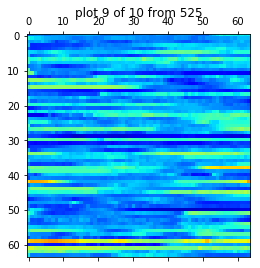

In [137]:
plot_t_raster(h[0])

#### delta weights

difference between weights inside a batch 

min: -0.44187337160110474, max: 0.4141170382499695


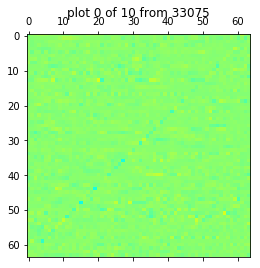

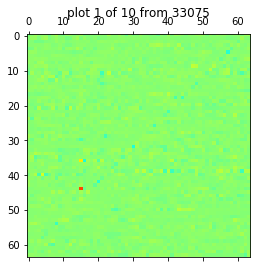

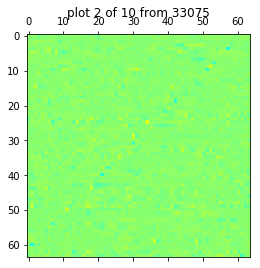

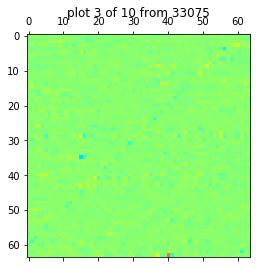

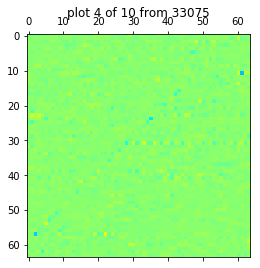

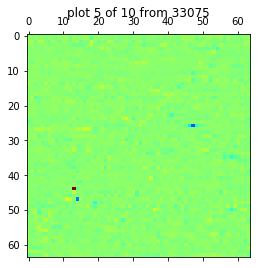

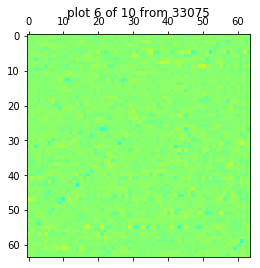

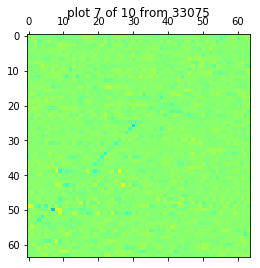

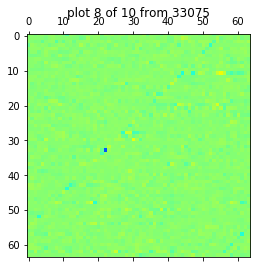

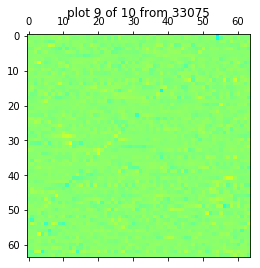

In [138]:
plot_t_raster(np.diff(h[0]))

#### delta weights

difference between weights between batches

min: -0.5583020448684692, max: 0.5772680044174194


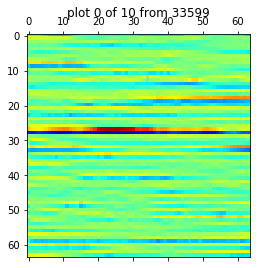

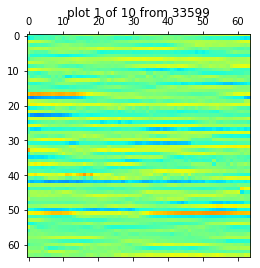

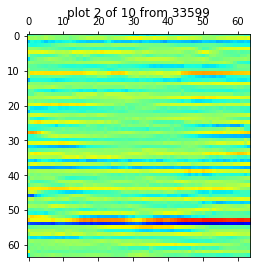

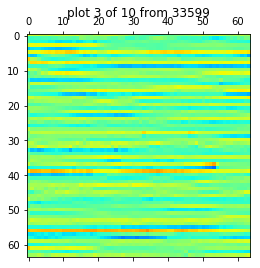

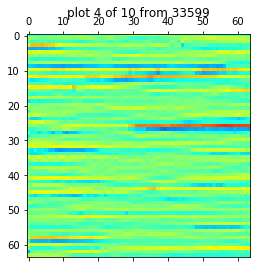

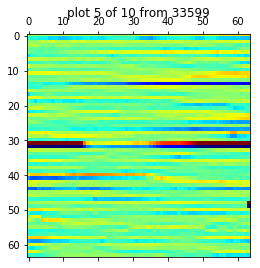

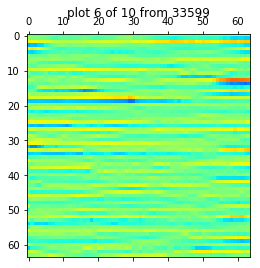

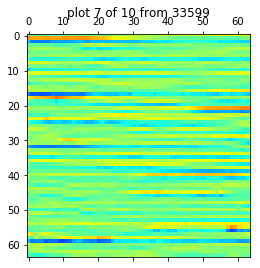

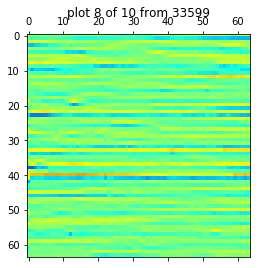

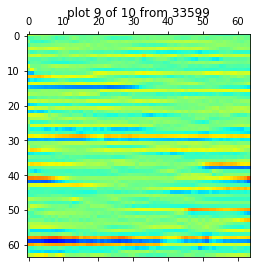

In [139]:
plot_t_raster(np.diff(h[0], axis=0))

In [140]:
bdelts=get_stacked_diff_grads(hooks_naive_grad_rebinned)

In [141]:
#number of epochs needs to be adjusted
plt_ttle=['epoch '+str(i) for i in range(5)]

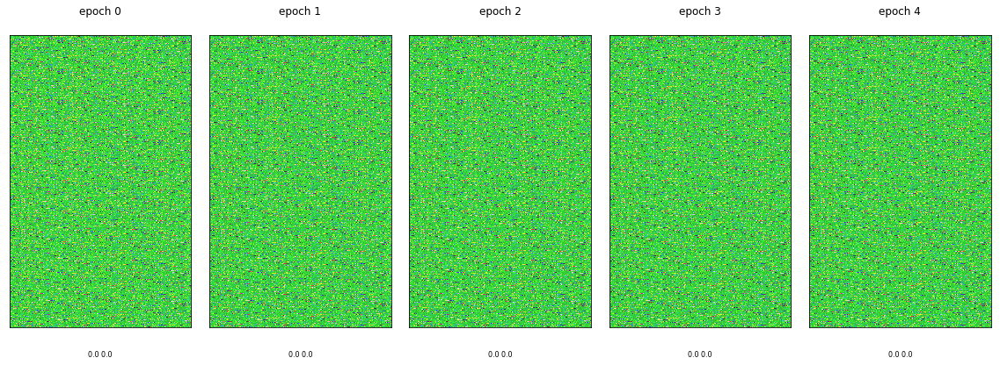

In [142]:
plot_bins(bdelts, plt_ttle, batch_max=False, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_naive_grad_delts.png')

In [143]:
all_layers=[]
for i,m in enumerate(learn.model):
    try:
        for j, k in enumerate(m):
            #cant traverse deeper into ResBlock as dont know if used id conv or not
            print(f'layer: {i} sub-layer: {j}, op: {k}')
            all_layers.append(k)
    except TypeError as e:            
        print(f'layer: {i} op: {m}')
        all_layers.append(m)

layer: 0 sub-layer: 0, op: Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
layer: 0 sub-layer: 1, op: ReLU(inplace)
layer: 1 sub-layer: 0, op: Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
layer: 1 sub-layer: 1, op: ReLU(inplace)
layer: 2 sub-layer: 0, op: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
layer: 2 sub-layer: 1, op: ReLU(inplace)
layer: 3 op: MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
layer: 4 sub-layer: 0, op: NBNResBlock(
  (convs): Sequential(
    (0): Sequential(
      (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): ReLU(inplace)
    )
    (1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
)
layer: 4 sub-layer: 1, op: NBNResBlock(
  (convs): Sequential(
    (0): Sequential(
      (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1

In [144]:
len(all_layers)

18

#### Histograms

In [145]:
len(hooks_naive)

11

In [146]:
ms,ss, hists = hooks_naive[0].stats
len(hists); 

In [147]:
hists[0].shape

torch.Size([40])

In [148]:
ms[0]

tensor(0.1002)

Intra batch weight changes - generated using difference of historgam for each batch (x)

In [149]:
hooks_naive_diffs=delta_hists(hooks_naive)

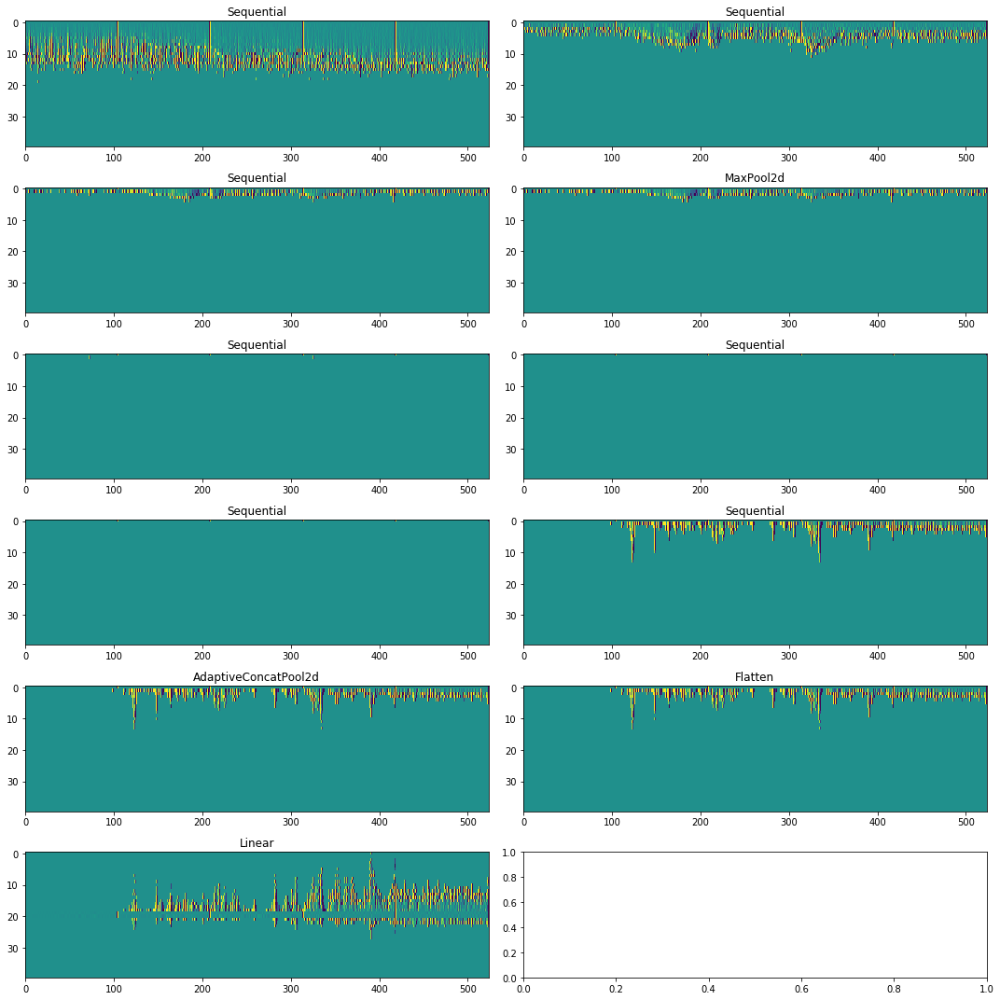

In [150]:
plot_hooks_hist_diffs(hooks_naive_diffs, cmap=plt.cm.viridis, norm=True, fig_name='naive_hists_diffs.png',model=learn.model)

Between batch weight changes

In [151]:
hooks_bb_naive_diffs=delta_bb_hists(hooks_naive)

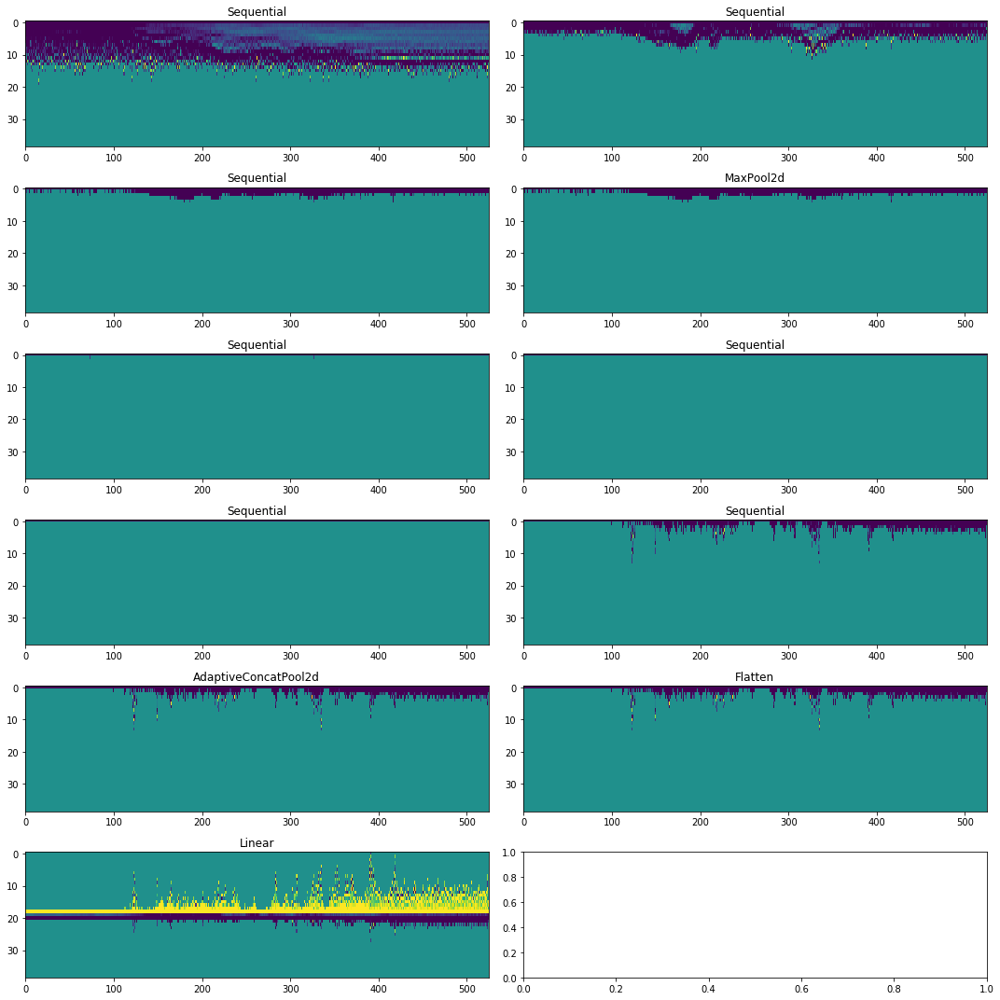

In [152]:
plot_hooks_hist_diffs(hooks_bb_naive_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_bb_naive_diffs.png',model=learn.model)

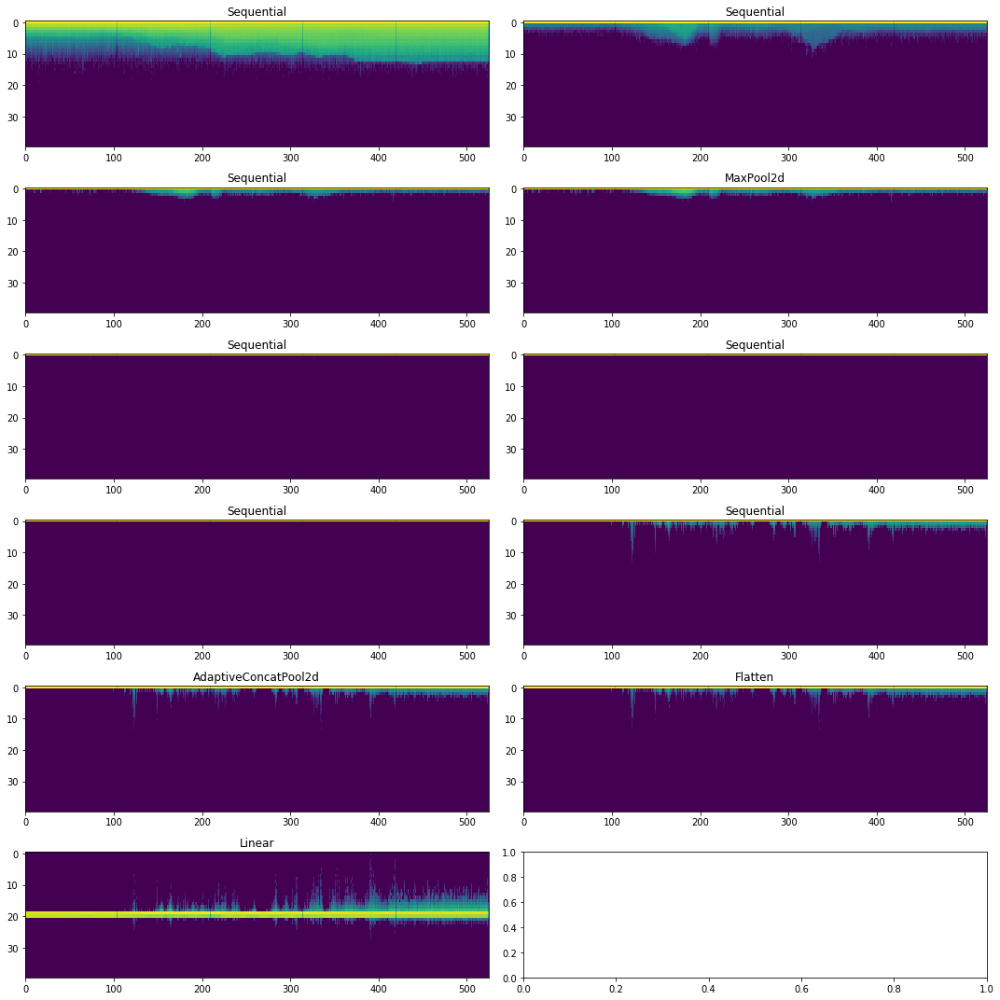

In [153]:
plot_hooks_hist(hooks_naive,fig_name='naive_hists.png',model=learn.model)

In [154]:
len(hooks_naive)

11

In [155]:
naive_del_ms,naive_del_ss, del_hist=diff_stats(hooks_naive)

##### Interbatch varation

Means changes

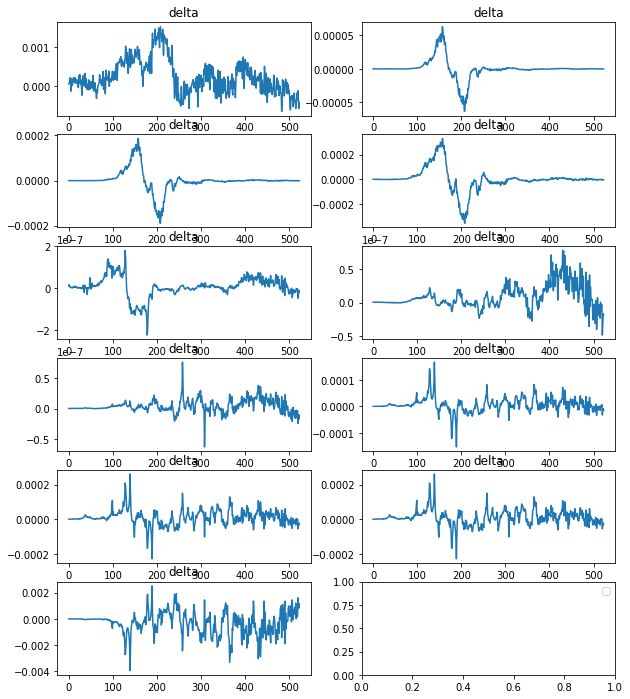

In [156]:
plot_deltas(naive_del_ms, 50, fig_name='naive_del_ms.png')

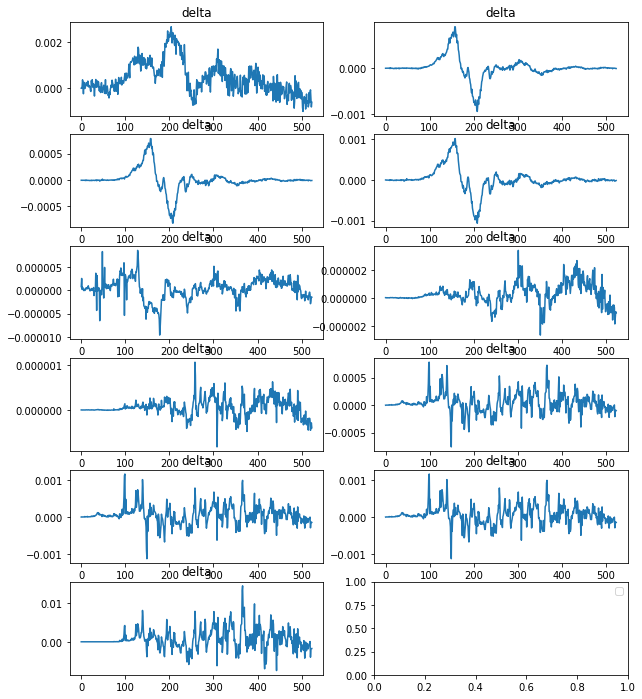

In [157]:
plot_deltas(naive_del_ss, 50, fig_name='naive_del_sds.png')

In [158]:
#plots above show difference between the single value of mean or variance for each batch, eg:
i=0
for h in hooks_naive:
    ms,ss, hists = h.stats
    print(len(ms))
    print(ms[0:10])
    if i>0:
        break
    i+=1

525
[tensor(0.1002), tensor(0.1023), tensor(0.1014), tensor(0.0948), tensor(0.1021), tensor(0.1149), tensor(0.1022), tensor(0.1030), tensor(0.1025), tensor(0.1036)]
525
[tensor(4.3667e-05), tensor(3.5480e-05), tensor(3.5885e-05), tensor(3.6373e-05), tensor(3.6814e-05), tensor(3.9703e-05), tensor(3.2564e-05), tensor(4.3016e-05), tensor(3.7822e-05), tensor(3.6149e-05)]


In [159]:
#del_hist=np.vstack(del_hist)

In [160]:
#del_hist.shape

In [161]:
#plot_deltas(del_hist, 50, fig_name='naive_del_hists.png')

Means change between first and last layer

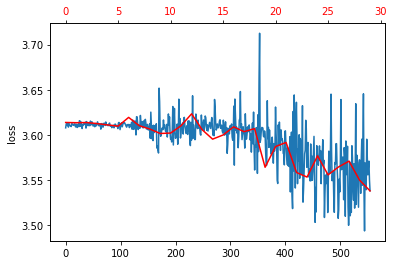

In [162]:
if REFIT:
    learn.recorder.plot_loss(save_path=IMG_PATH+'/'+NAME+'_naive_loss.png')

## adapt_model and gradual unfreezing

Lines above pasted into one cell to create a function (Shift-M)

In [163]:
def adapt_model(learn, data):
    cut = next(i for i,o in enumerate(learn.model.children())
               if isinstance(o,nn.AdaptiveAvgPool2d))
    m_cut = learn.model[:cut]
    xb,yb = get_batch(data.valid_dl, learn)
    pred = m_cut(xb)
    ni = pred.shape[1]
    m_new = nn.Sequential(
        #replace m_cut with children to get data for each layer in XResNet
        *m_cut.children(), AdaptiveConcatPool2d(), Flatten(),
        nn.Linear(ni*2, data.c_out))
    learn.model = m_new

In [164]:
def adapt_deep_model(learn, data):
    cut = next(i for i,o in enumerate(learn.model.children())
               if isinstance(o,nn.AdaptiveAvgPool2d))
    m_cut = learn.model[:cut]
    m_gc = module_grandchildren(m_cut)
    xb,yb = get_batch(data.valid_dl, learn)
    pred = m_cut(xb)
    ni = pred.shape[1]
    m_new = nn.Sequential(
        #replace m_cut with grandchildren to get data for each layer in XResNet
        *m_gc, AdaptiveConcatPool2d(), Flatten(),
        nn.Linear(ni*2, data.c_out))
    learn.model = m_new

In [165]:
def adapt_simple_model(learn, data):
    cut = next(i for i,o in enumerate(learn.model.children())
               if isinstance(o,nn.AdaptiveAvgPool2d))
    m_cut = learn.model[:cut]
    xb,yb = get_batch(data.valid_dl, learn)
    pred = m_cut(xb)
    ni = pred.shape[1]
    m_new = nn.Sequential(
        m_cut, AdaptiveConcatPool2d(), Flatten(),
        nn.Linear(ni*2, data.c_out))
    learn.model = m_new

In [168]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func, c_out=10, norm=norm_imagenette, xtra_cb=[Recorder, GradsCallback])
learn.model.load_state_dict(torch.load(mdl_path/pt_wts))

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

In [169]:
if HOOK_DEPTH=='deep':
    adapt_deep_model(learn, data)
elif HOOK_DEPTH=='base':
    adapt_model(learn, data)
elif HOOK_DEPTH=='shallow':
    adapt_simple_model(learn, data)

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time


>>1335 Recorder.begin_fit()


basic model as per lesson len: 4, with children len: 11, with grandchildren len: 20

In [170]:
len(learn.model); HOOK_DEPTH

'base'

Grab all parameters in the body (the m_cut bit) and dont train these - just train the head

#### Freeze everything before head

In [171]:
#everything before AdaptiveConcatPool2d 
for i in range(len(learn.model)-3):
    for p in learn.model[0].parameters(): p.requires_grad_(False)

In [172]:
if REFIT:
    with Hooks(learn.model, append_hist_rebinned_stats) as hooks_freeze: 
        learn.fit(3, sched_1cycle(1e-2, 0.5))
    hooks_freeze_grad_rebinned=learn.grad_rebinned
    if SAVE_COMPRESSED_WTS:
        np.save(f'{HOOK_PATH}/hooks_freeze.npy', hooks_freeze)
        np.save(f'{HOOK_PATH}/hooks_freeze_grad_rebinned', learn.grad_rebinned)
else:
    hooks_freeze = np.load(f'{HOOK_PATH}/hooks_freeze.npy')
    hooks_freeze_grad_rebinned = np.load(f'{HOOK_PATH}/hooks_freeze_grad_rebinned.npy')

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,3.610247,0.027899,3.610977,0.017981,01:20
1,3.612135,0.029249,3.609849,0.019364,01:20
2,3.599664,0.033298,3.607424,0.033195,01:20


>>1335 Recorder.begin_fit()


plotting 11 layers


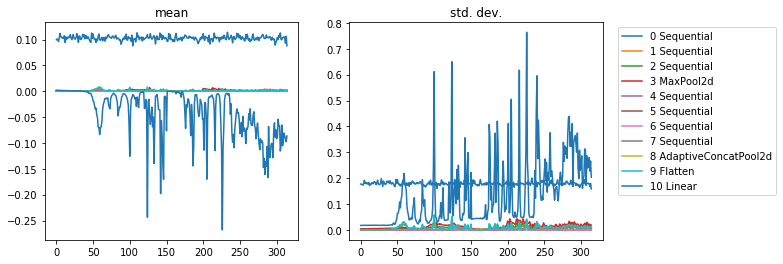

In [173]:
plot_hooks(hooks_freeze,fig_name='freeze_layer_stats.png',model=learn.model)

In [174]:
h=reshape_h_data(hooks_freeze)

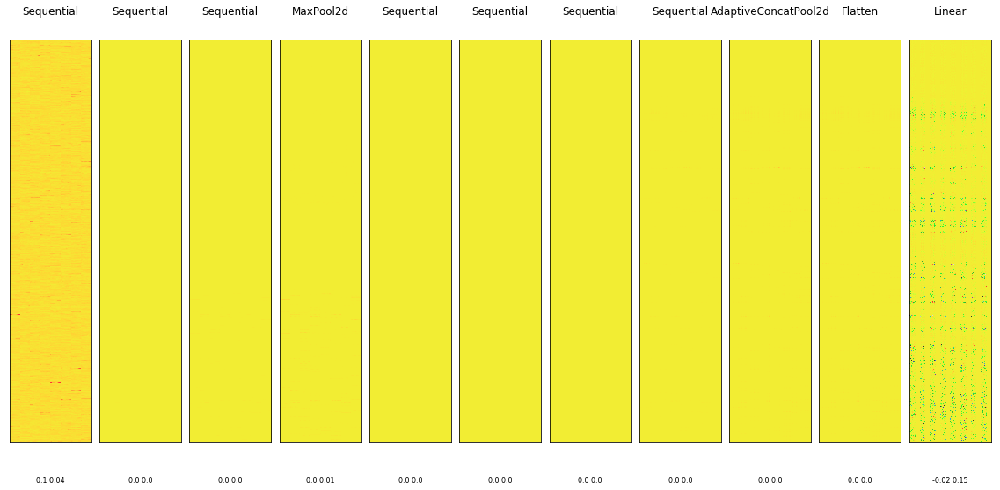

In [175]:
plot_bins(h, mod_summary, batch_max=True, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze_bmax.png')

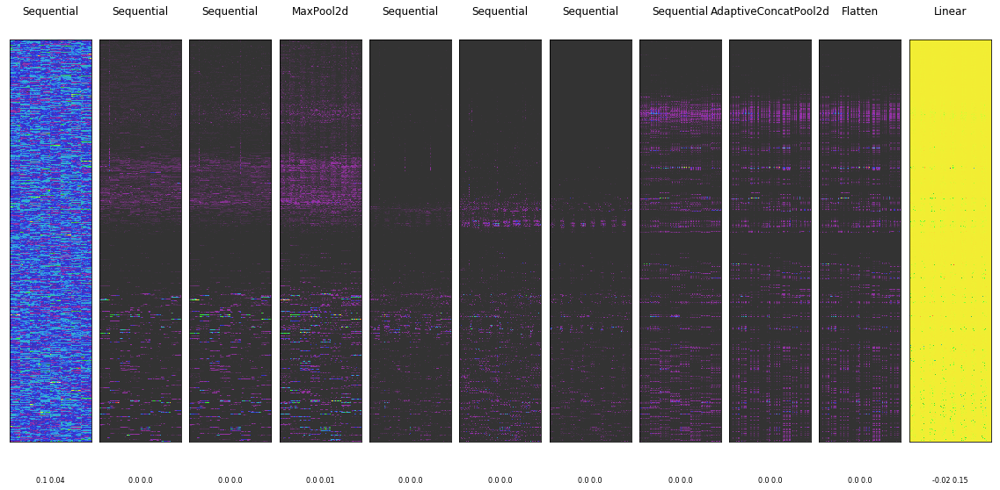

In [176]:
plot_bins(h, mod_summary, batch_max=False, scalar=0.8, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze.png')

Intra batch weight changes - generated using difference of historgam for each batch (x)

In [177]:
hooks_freeze_diffs=delta_hists(hooks_freeze)

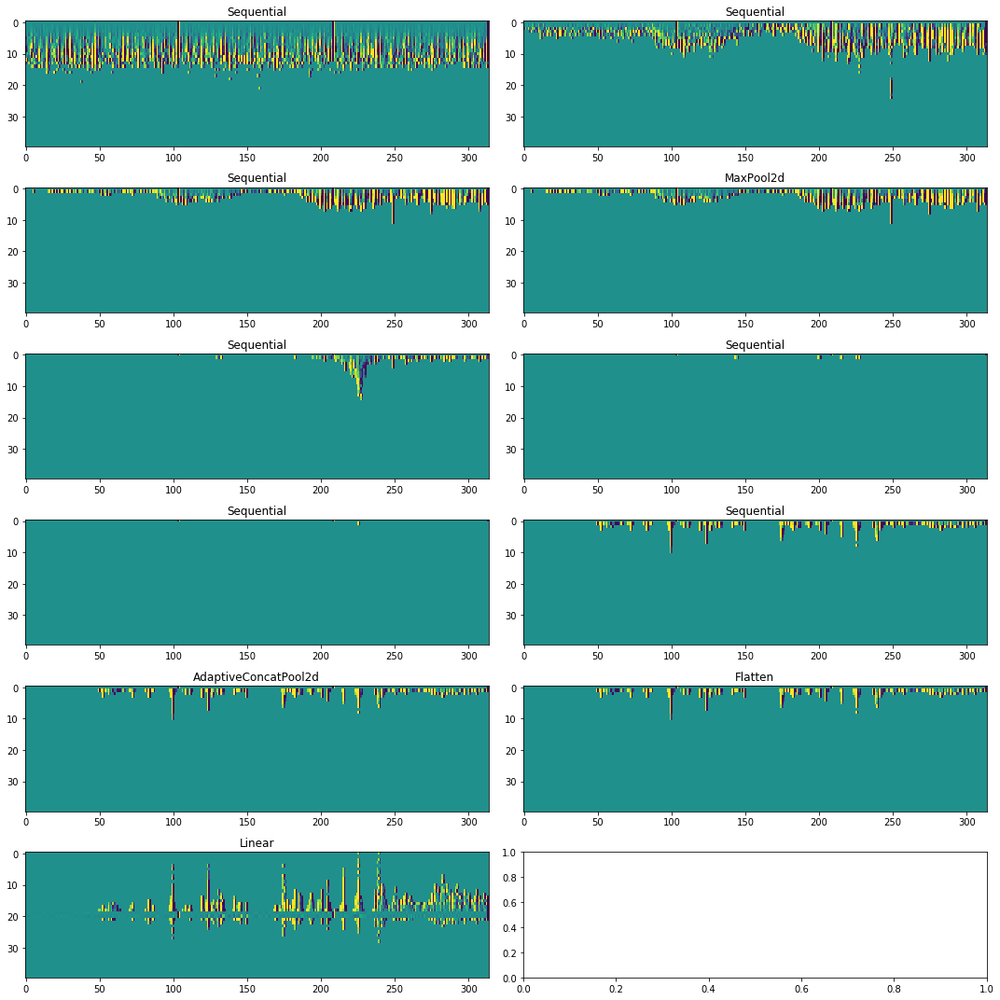

In [178]:
plot_hooks_hist_diffs(hooks_freeze_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_freeze_diffs.png',model=learn.model)

Between batch weight changes

In [179]:
hooks_freeze_bb_diffs=delta_bb_hists(hooks_freeze)

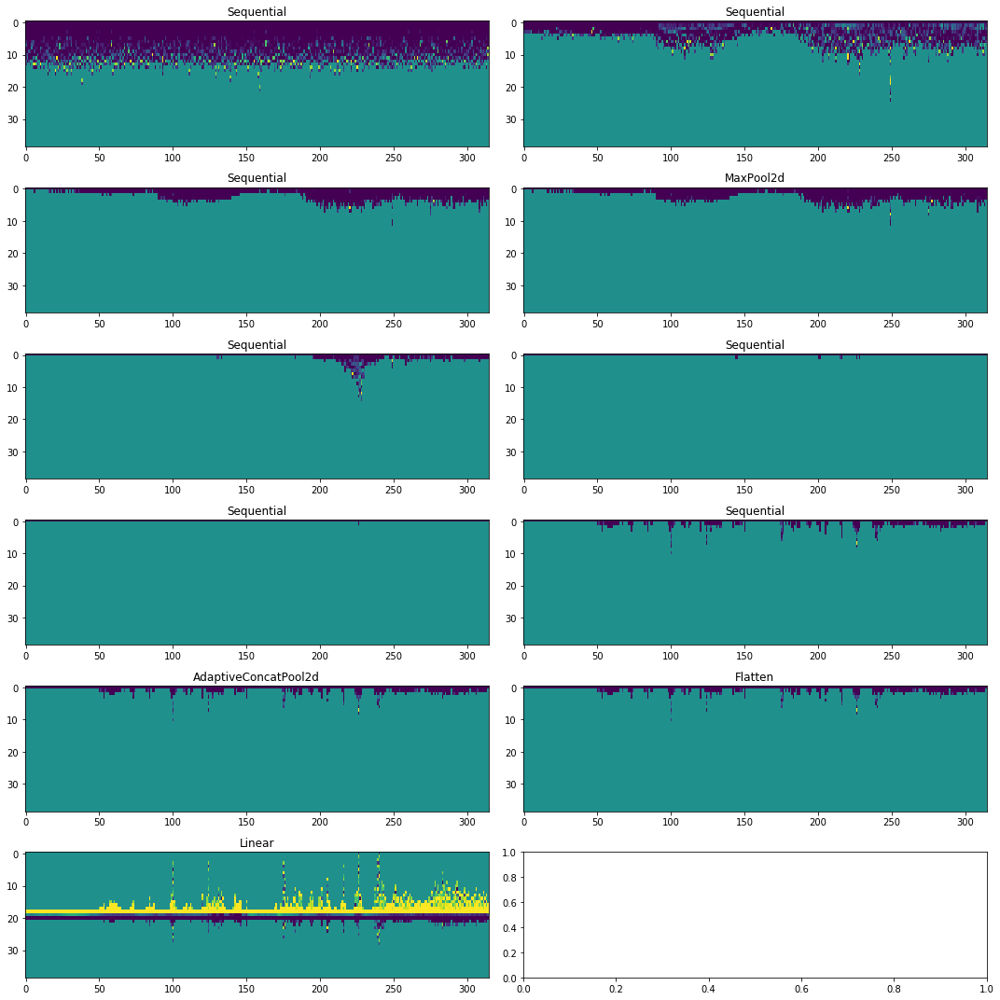

In [180]:
plot_hooks_hist_diffs(hooks_freeze_bb_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_freeze_bb_diffs.png',model=learn.model)

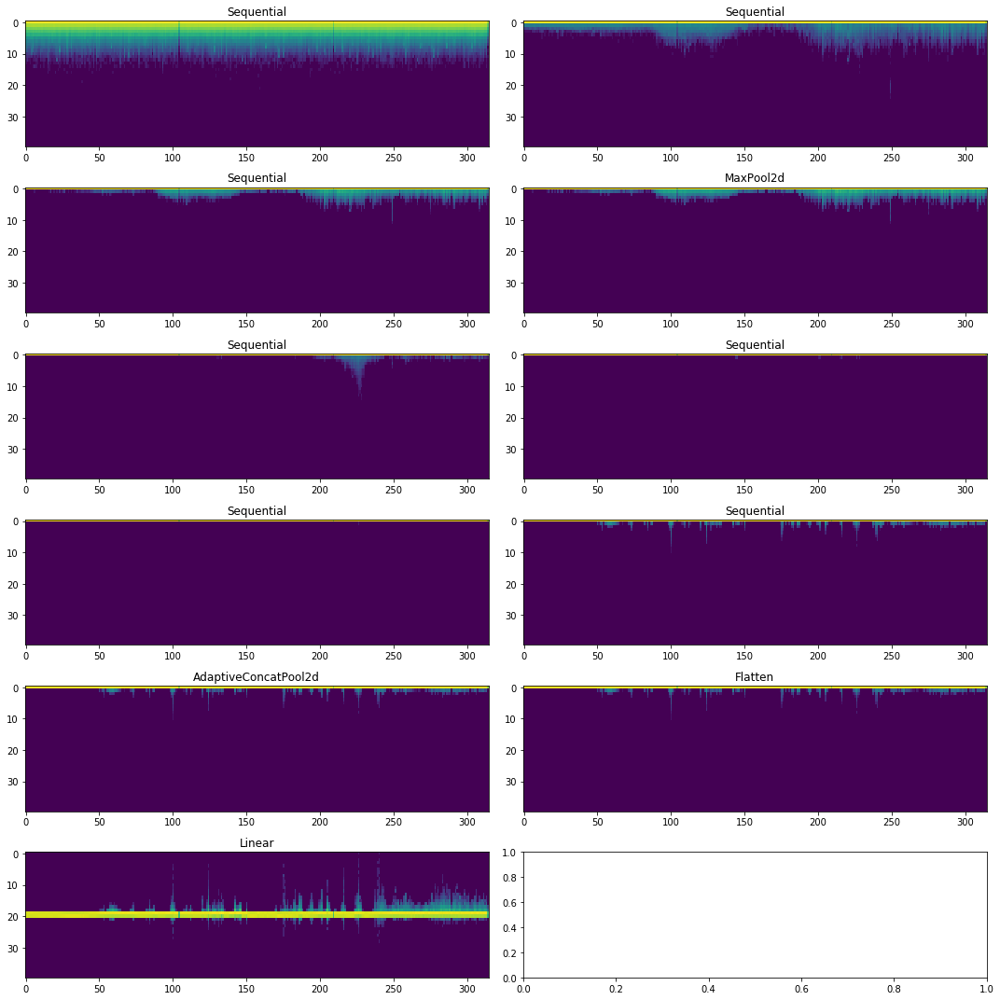

In [181]:
plot_hooks_hist(hooks_freeze,fig_name='freeze_hists.png',model=learn.model)

#### Grads

gradients per batch, note these are results of calcs on an epoch level, rather than layer level as called after loss.backward but before zeroing the gradients

In [182]:
b=get_stacked_grads(hooks_freeze_grad_rebinned)

In [183]:
#subtract the scalar we applied before tanking means
e=b[0]-GRAD_SCALAR

In [184]:
bd=get_stacked_grads(hooks_freeze_grad_rebinned, GRAD_SCALAR)

In [185]:
#number of epochs needs to be adjusted
plt_ttle=['epoch '+str(i) for i in range(3)]

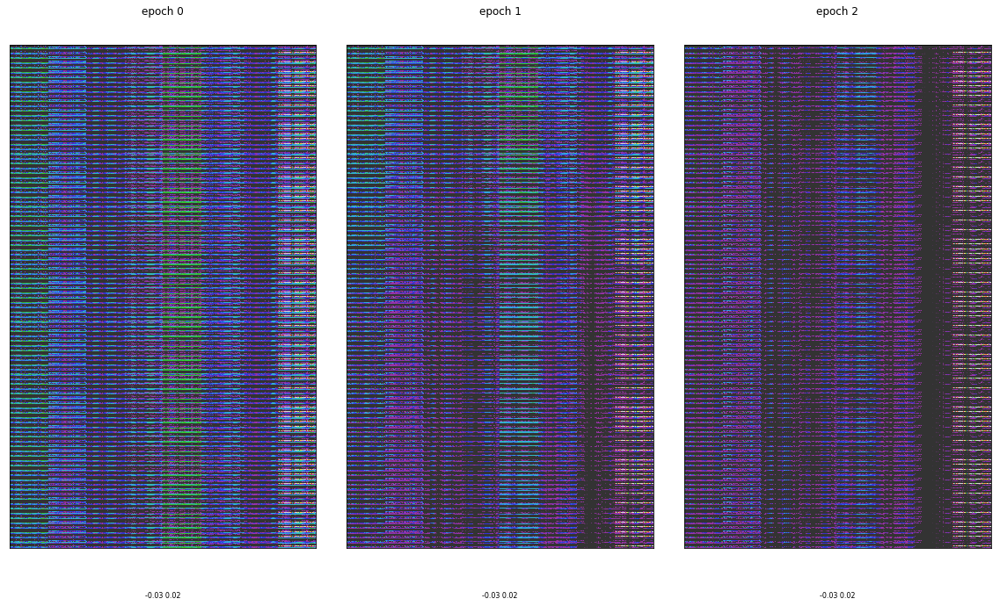

In [186]:
plot_bins(bd, plt_ttle, batch_max=False, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze_grad_rebinned.png')

#### Delta Grads

plot difference between gradients per batch, note this is done on an epoch level, rather than layer level



In [187]:
bdelts=get_stacked_diff_grads(hooks_freeze_grad_rebinned)

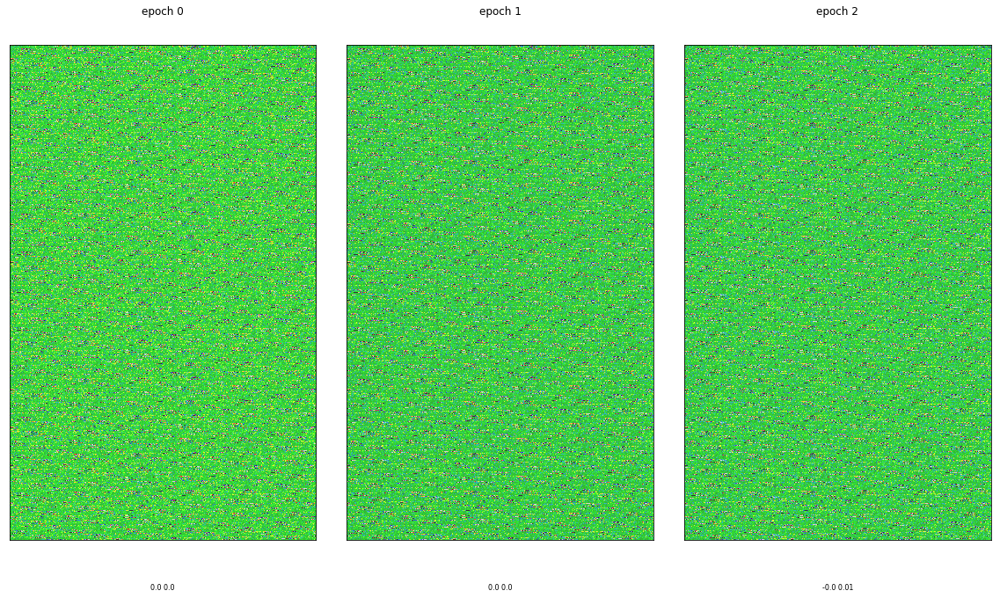

In [188]:
plot_bins(bdelts, plt_ttle, batch_max=False, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze_grad_rebinned_deltas.png')


In [189]:
d=np.diff(e)

min: -0.043636322021484375, max: 0.04048919677734375


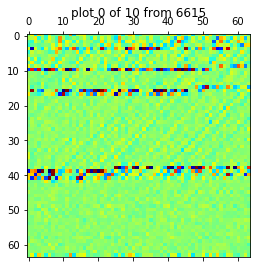

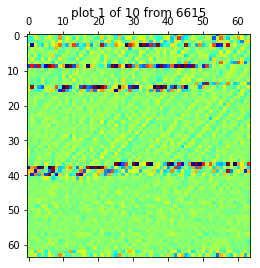

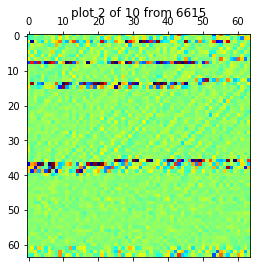

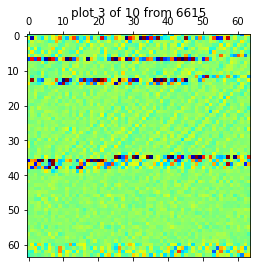

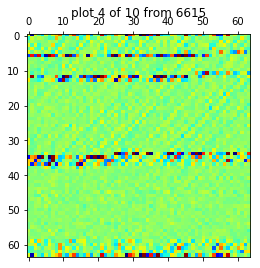

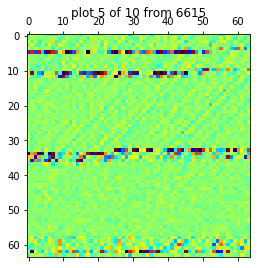

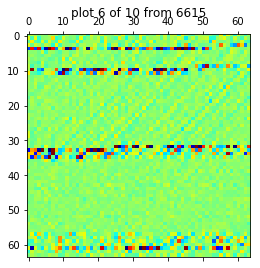

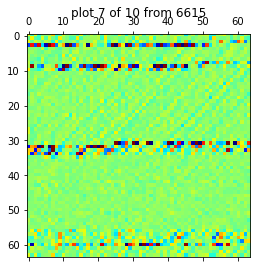

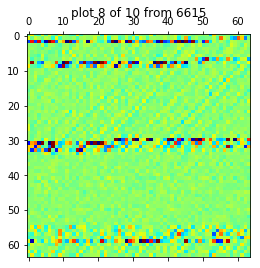

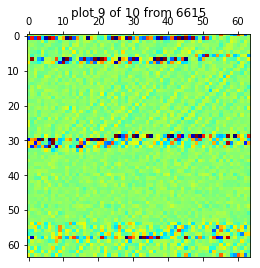

In [190]:
plot_t_raster(d)

min: 0.0003169593692291528, max: 0.6129499077796936


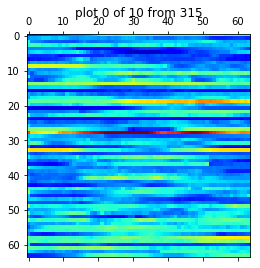

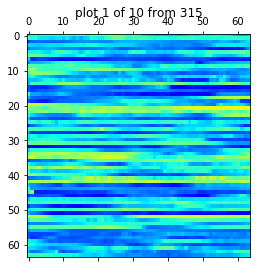

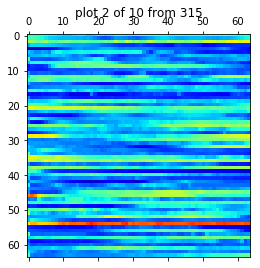

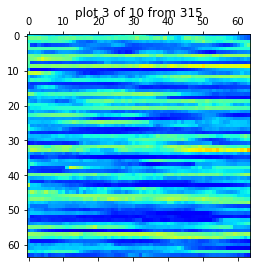

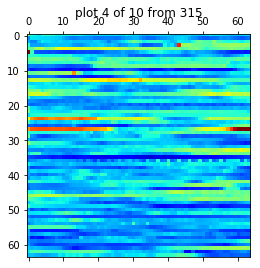

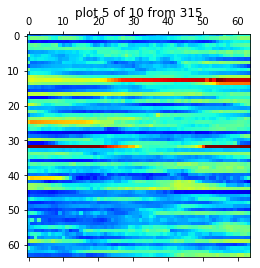

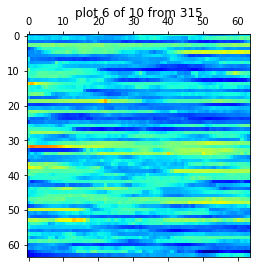

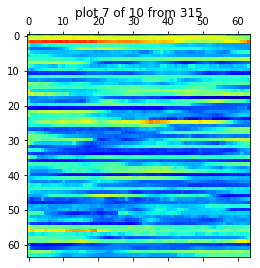

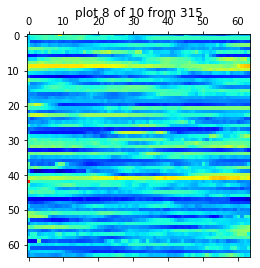

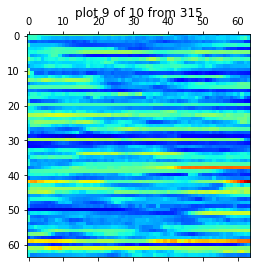

In [191]:
plot_t_raster(h[0])

#### weight deltas

In [192]:
frozen_del_ms,frozen_del_ss,frozen_del_hists=diff_stats(hooks_freeze)

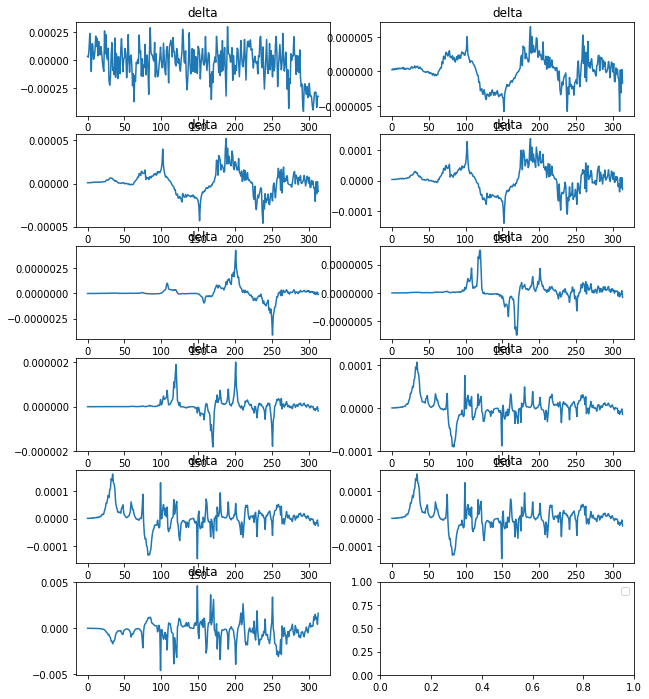

In [193]:
plot_deltas(frozen_del_ms, 50,fig_name='freeze_del_ms.png')

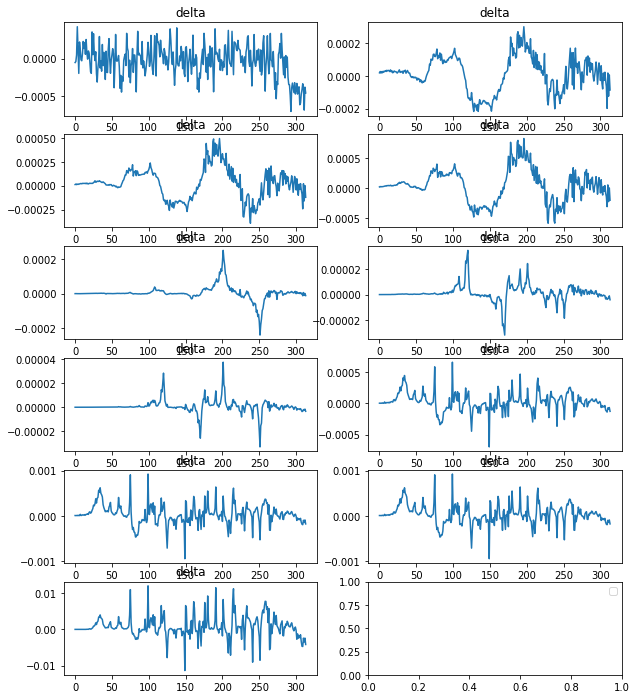

In [194]:
plot_deltas(frozen_del_ss, 50,fig_name='freeze_del_sds.png')

In [195]:
#frozen_del_hists=np.vstack(frozen_del_hists)

In [196]:
#plot_deltas(frozen_del_hists, 50,fig_name='frozen_del_hists.png')

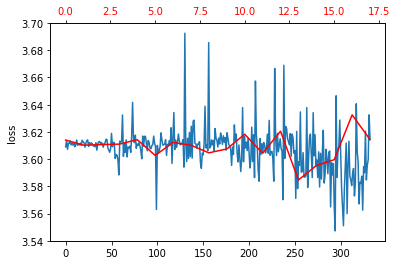

In [197]:
if REFIT:
    learn.recorder.plot_loss(save_path=IMG_PATH+'/'+NAME+'_freeze_loss.png')

#### Unfreeze

In [198]:
#everything before AdaptiveConcatPool2d - note difference to lesson nb where just have layer 0
for i in range(len(learn.model)-3):
    for p in learn.model[i].parameters(): p.requires_grad_(True)

In [199]:
if REFIT:
    with Hooks(learn.model, append_hist_rebinned_stats) as hooks_unfreeze: 
        learn.fit(5, cbsched, reset_opt=True)
    hooks_unfreeze_grad_rebinned=learn.grad_rebinned
    if SAVE_COMPRESSED_WTS:
        np.save(f'{HOOK_PATH}/hooks_unfreeze.npy', hooks_unfreeze)
        np.save(f'{HOOK_PATH}/hooks_unfreeze_grad_rebinned', learn.grad_rebinned)
else:
    hooks_unfreeze = np.load(f'{HOOK_PATH}/hooks_unfreeze.npy')
    hooks_unfreeze_grad_rebinned = np.load(f'{HOOK_PATH}/hooks_unfreeze_grad_rebinned.npy')

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,3.587621,0.039298,3.605370,0.033195,01:02
1,3.587779,0.041248,3.619451,0.033195,01:06
2,3.591050,0.038998,3.636768,0.034578,01:15
3,3.582148,0.045748,3.596649,0.022130,01:15
4,3.577909,0.041398,3.596782,0.034578,01:14


>>1335 Recorder.begin_fit()



In frozen layer - train for particuar mean and std dev, but pets has different std dev and means inside the model.

What is really going on here? (1:26 in lesson video), and why do I get better results when JH got worse result?

plotting 11 layers


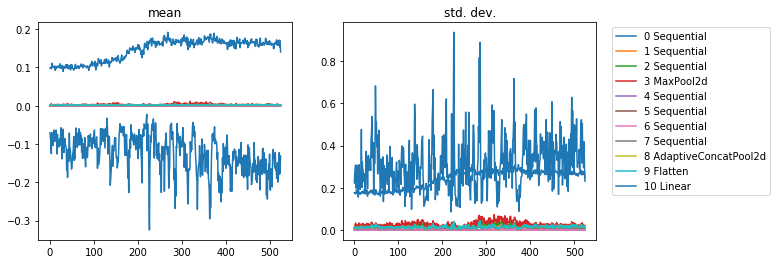

In [200]:
plot_hooks(hooks_unfreeze,fig_name='unfreeze_layer_stats.png',model=learn.model)

In [201]:
h=reshape_h_data(hooks_unfreeze)

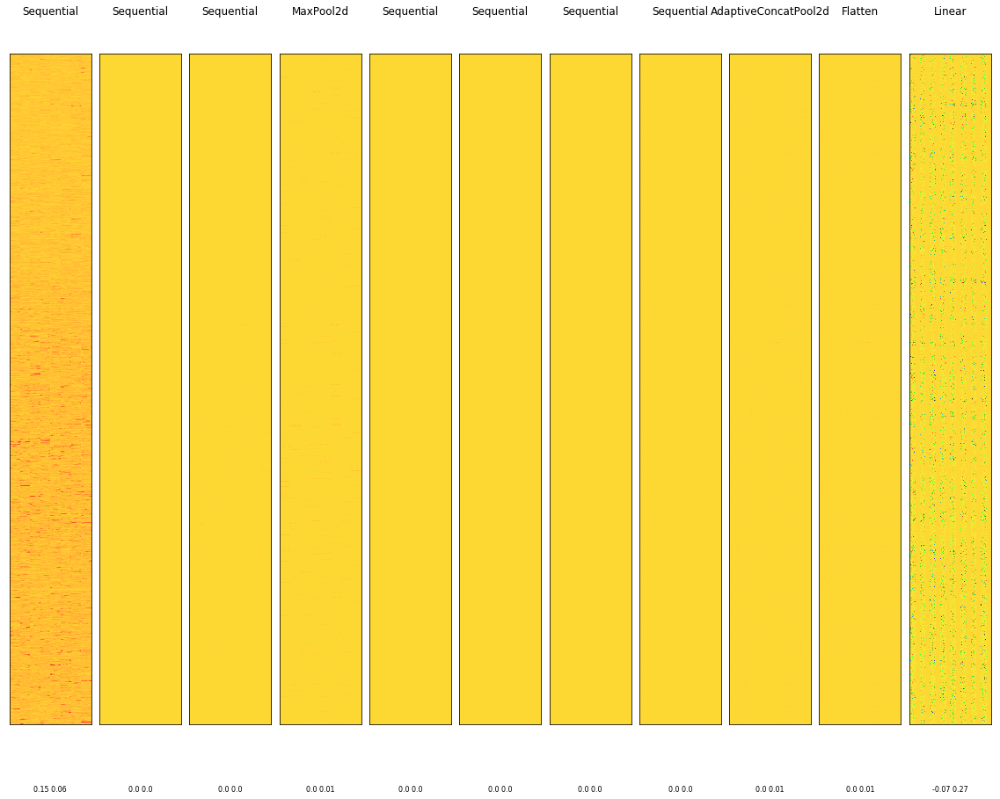

In [202]:
plot_bins(h, mod_summary, batch_max=True, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_unfreeze_bmax.png')

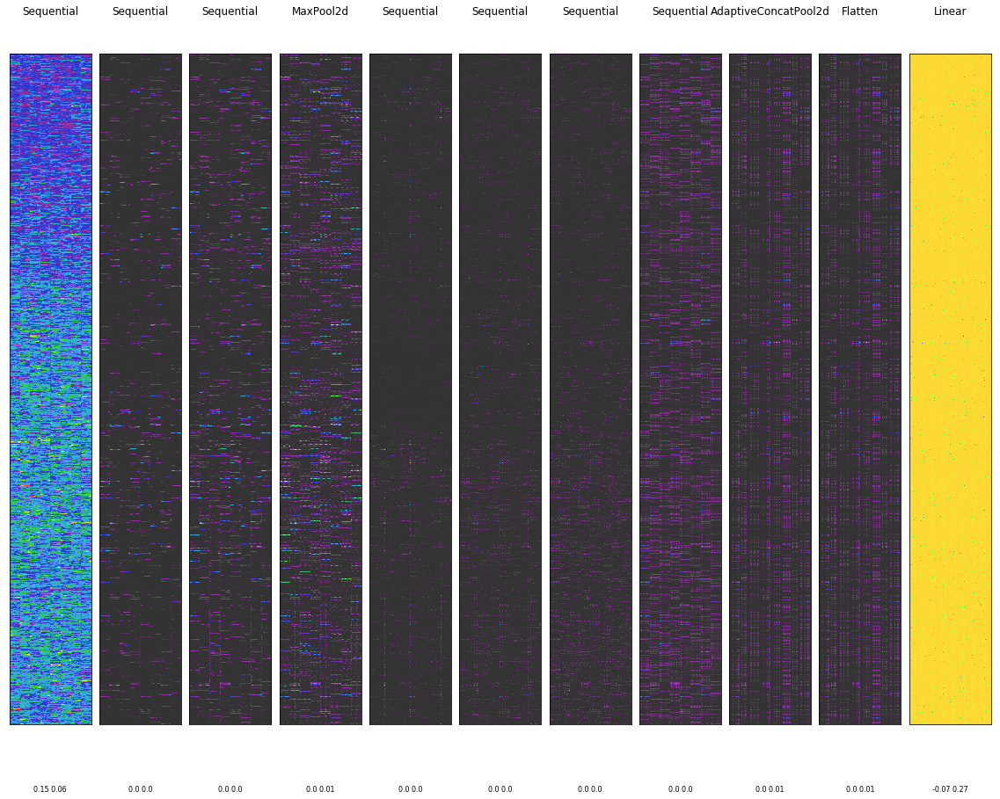

In [203]:
plot_bins(h, mod_summary, batch_max=False, scalar=0.8, cmap=plt.cm.nipy_spectral, fig_name='hooks_unfreeze.png')

Intra batch weight changes - generated using difference of historgam for each batch (x)

In [204]:
hooks_unfreeze_diffs=delta_hists(hooks_unfreeze)

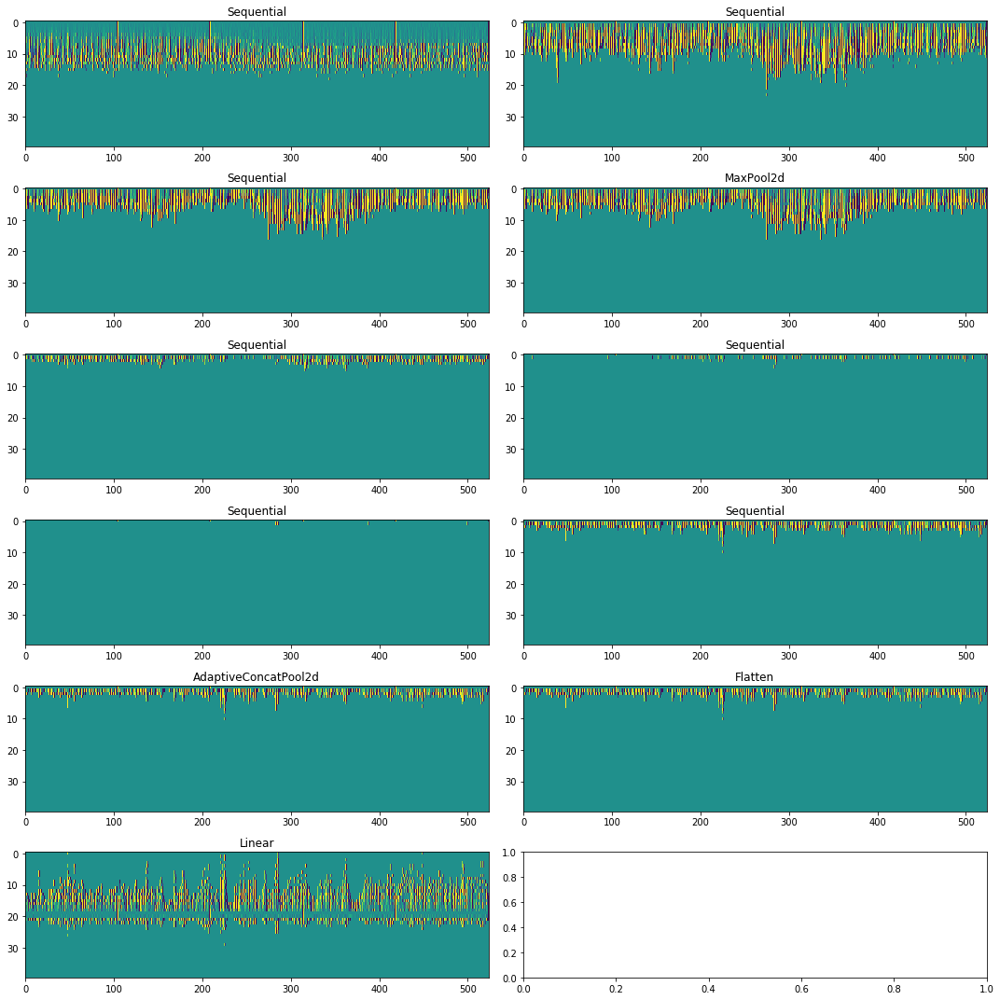

In [205]:
plot_hooks_hist_diffs(hooks_unfreeze_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_unfreeze_diffs.png',model=learn.model)

Between batch weight changes

In [206]:
hooks_unfreeze_bb_diffs=delta_bb_hists(hooks_unfreeze)

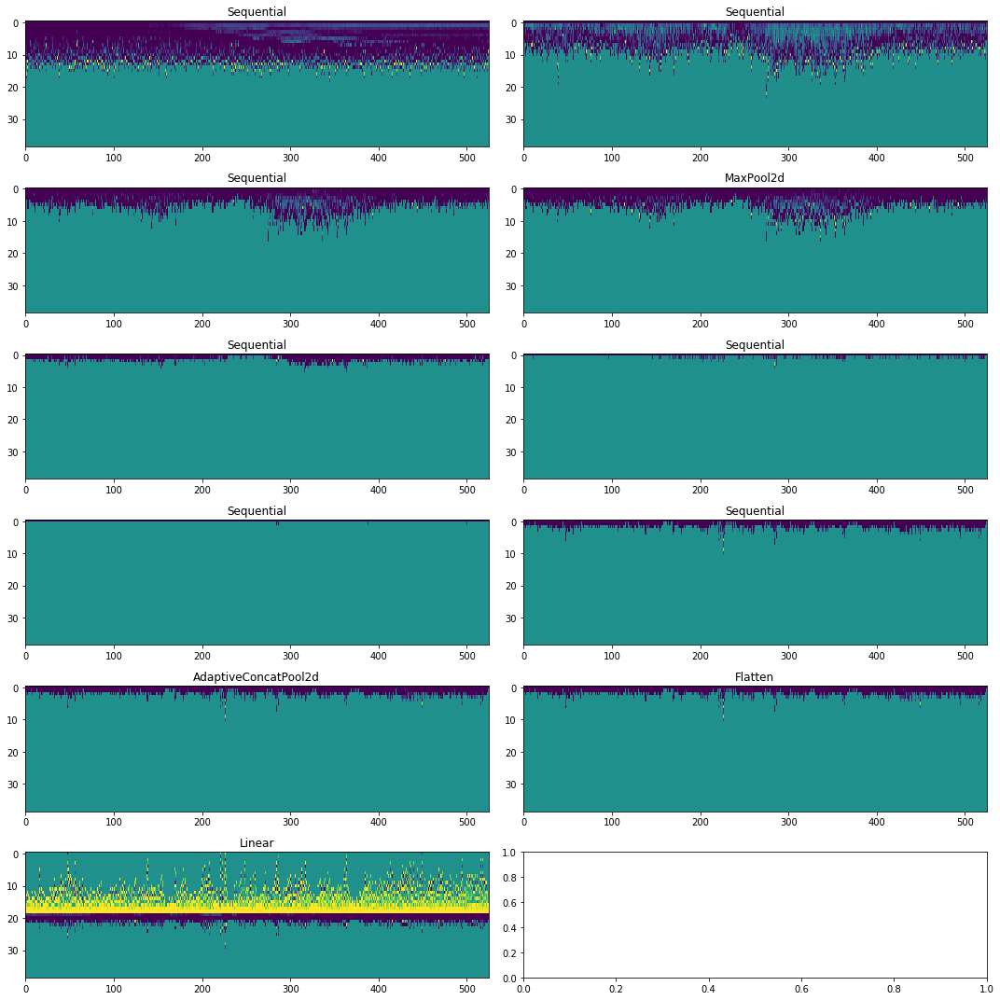

In [207]:
plot_hooks_hist_diffs(hooks_unfreeze_bb_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_unfreeze_bb_diffs.png',model=learn.model)

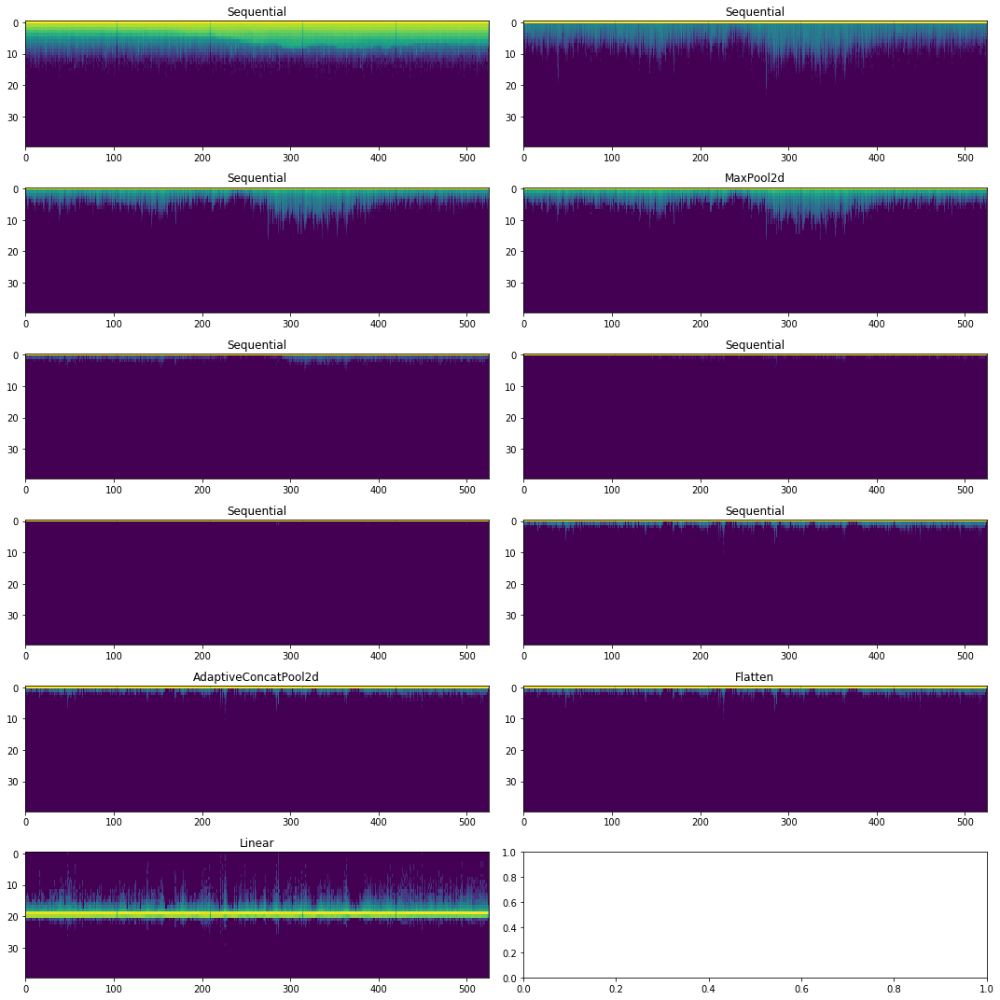

In [208]:
plot_hooks_hist(hooks_unfreeze,fig_name='unfreeze_hists.png',model=learn.model)

In [209]:
unfrozen_del_ms,unfrozen_del_ss, unfrozen_del_hist=diff_stats(hooks_unfreeze)

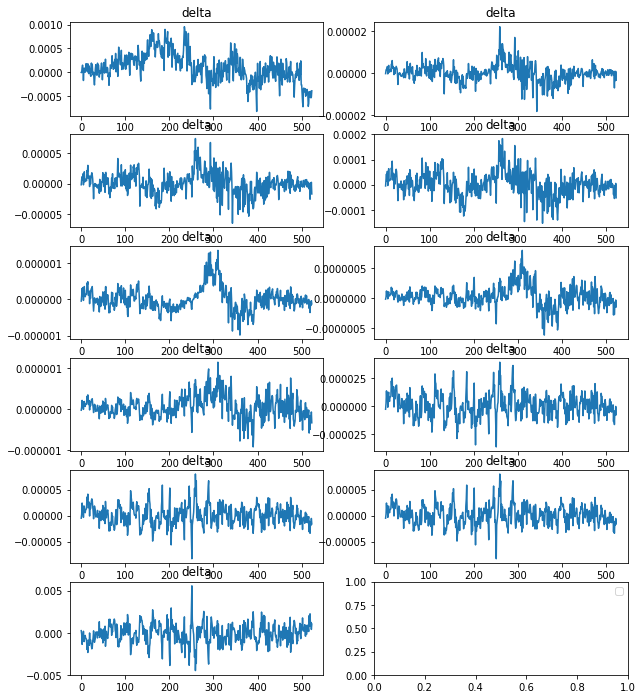

In [210]:
plot_deltas(unfrozen_del_ms, 50,fig_name='unfreeze_del_ms.png')

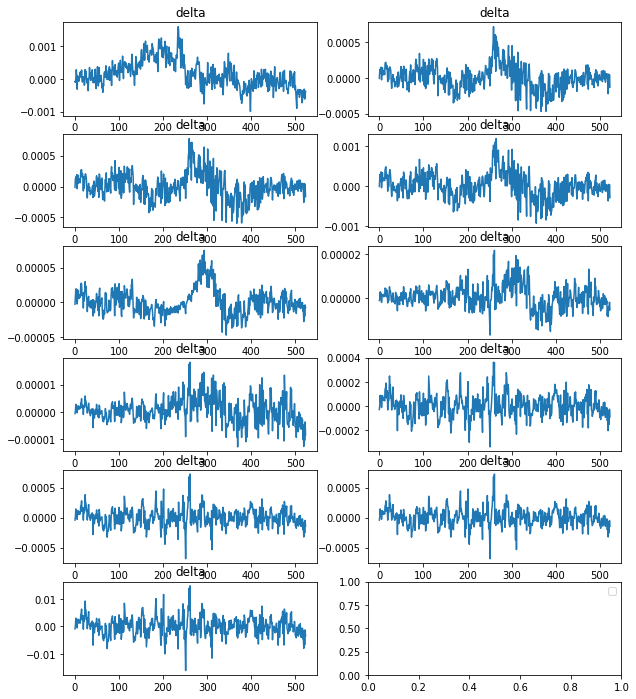

In [211]:
plot_deltas(unfrozen_del_ss, 50,fig_name='unfreeze_del_sds.png')

In [212]:
#unfrozen_del_hist=np.vstack(unfrozen_del_hist)

In [213]:
#plot_deltas(unfrozen_del_hist, 50,fig_name='unfrozen_del_hist.png')

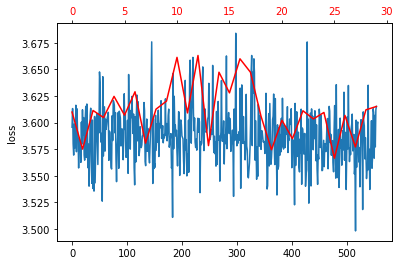

In [214]:
if REFIT:
    learn.recorder.plot_loss(save_path=IMG_PATH+'/'+NAME+'_unfreeze_loss.png')

Freeze only layer params that aren't in the batch norm layers

1:27 in lesson 12

## Batch norm transfer

Freeze all params that are not in the batchnorm layer or linear layer at end

In [215]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func, c_out=10, norm=norm_imagenette, xtra_cb=[Recorder, GradsCallback])
learn.model.load_state_dict(torch.load(mdl_path/pt_wts))


IncompatibleKeys(missing_keys=[], unexpected_keys=[])

In [216]:
if HOOK_DEPTH=='deep':
    adapt_deep_model(learn, data)
elif HOOK_DEPTH=='base':
    adapt_model(learn, data)
elif HOOK_DEPTH=='shallow':
    adapt_simple_model(learn, data)

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time


>>1335 Recorder.begin_fit()


In [217]:
def apply_mod(m, f):
    f(m)
    for l in m.children(): apply_mod(l, f)

def set_grad(m, b):
    #if linear layer (at end) or batchnorm layer in middle, dont change the gradient
    #print(type(m))
    if isinstance(m, (nn.Linear,nn.BatchNorm2d)): return
    if hasattr(m, 'weight'):
        for p in m.parameters(): p.requires_grad_(b)

#### Freeze and fit

Freeze just non batchnorm and last layer, note using apply_mod we traverse children layers so can access Batchnorm layers inside sequential

In [218]:
apply_mod(learn.model, partial(set_grad, b=False))

In [219]:
if REFIT:
    with Hooks(learn.model, append_hist_rebinned_stats) as hooks_freeze_non_bn: 
        learn.fit(3, sched_1cycle(1e-2, 0.5))
    hooks_freeze_non_bn_grad_rebinned=learn.grad_rebinned
    if SAVE_COMPRESSED_WTS:
        np.save(f'{HOOK_PATH}/hooks_freeze_non_bn.npy', hooks_freeze_non_bn)
        np.save(f'{HOOK_PATH}/hooks_freeze_non_bn_grad_rebinned', learn.grad_rebinned)
else:
    hooks_freeze_non_bn = np.load(f'{HOOK_PATH}/hooks_freeze_non_bn.npy')
    hooks_freeze_non_bn_grad_rebinned = np.load(f'{HOOK_PATH}/hooks_freeze_non_bn_grad_rebinned.npy')

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,3.611585,0.027749,3.613216,0.020747,01:10
1,3.612762,0.020999,3.614462,0.020747,01:15
2,3.610776,0.025049,3.613447,0.019364,01:16


>>1335 Recorder.begin_fit()


plotting 11 layers


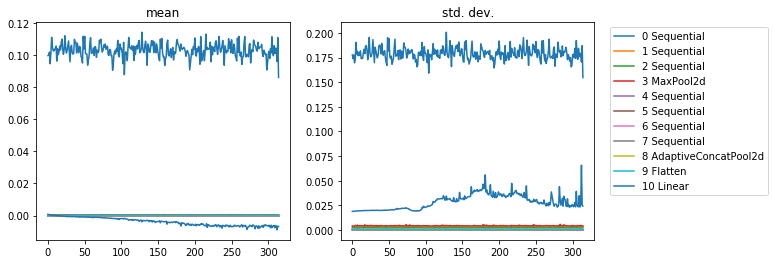

In [220]:
plot_hooks(hooks_freeze_non_bn,fig_name='freeze_non_bn_layers.png',model=learn.model)

In [221]:
h=reshape_h_data(hooks_freeze_non_bn)

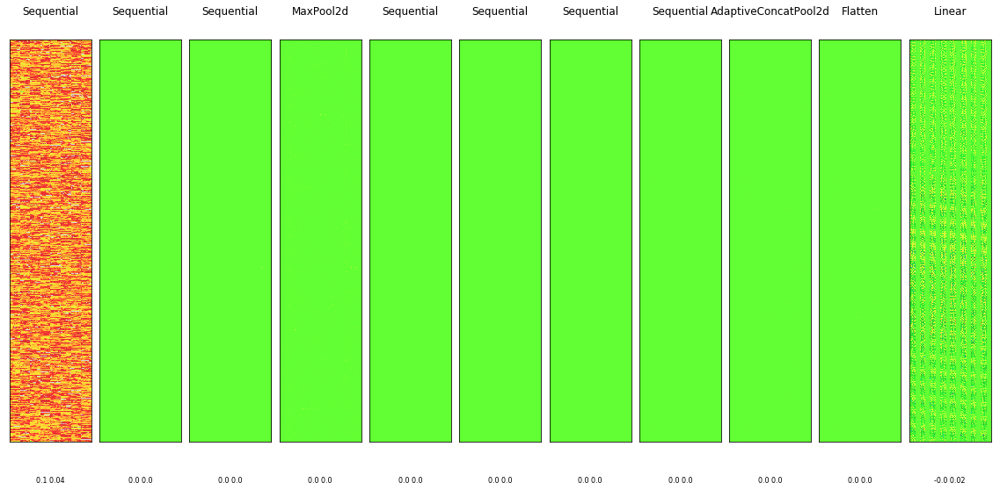

In [222]:
plot_bins(h, mod_summary, batch_max=True, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze_non_bn_bmax.png')

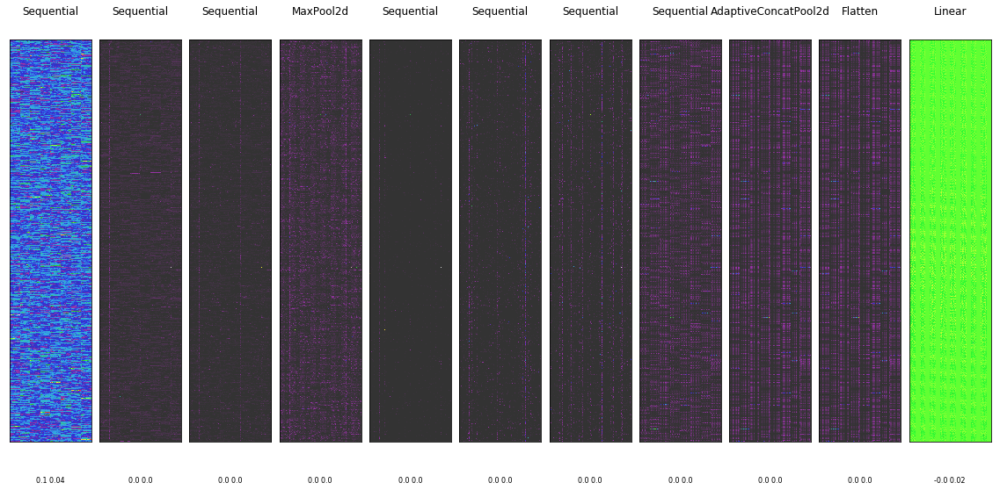

In [223]:
plot_bins(h, mod_summary, batch_max=False, scalar=0.8, cmap=plt.cm.nipy_spectral, fig_name='hooks_freeze_non_bn.png')

Intra batch weight changes - generated using difference of historgam for each batch (x)

In [224]:
hooks_freeze_non_bn_diffs=delta_hists(hooks_freeze_non_bn)

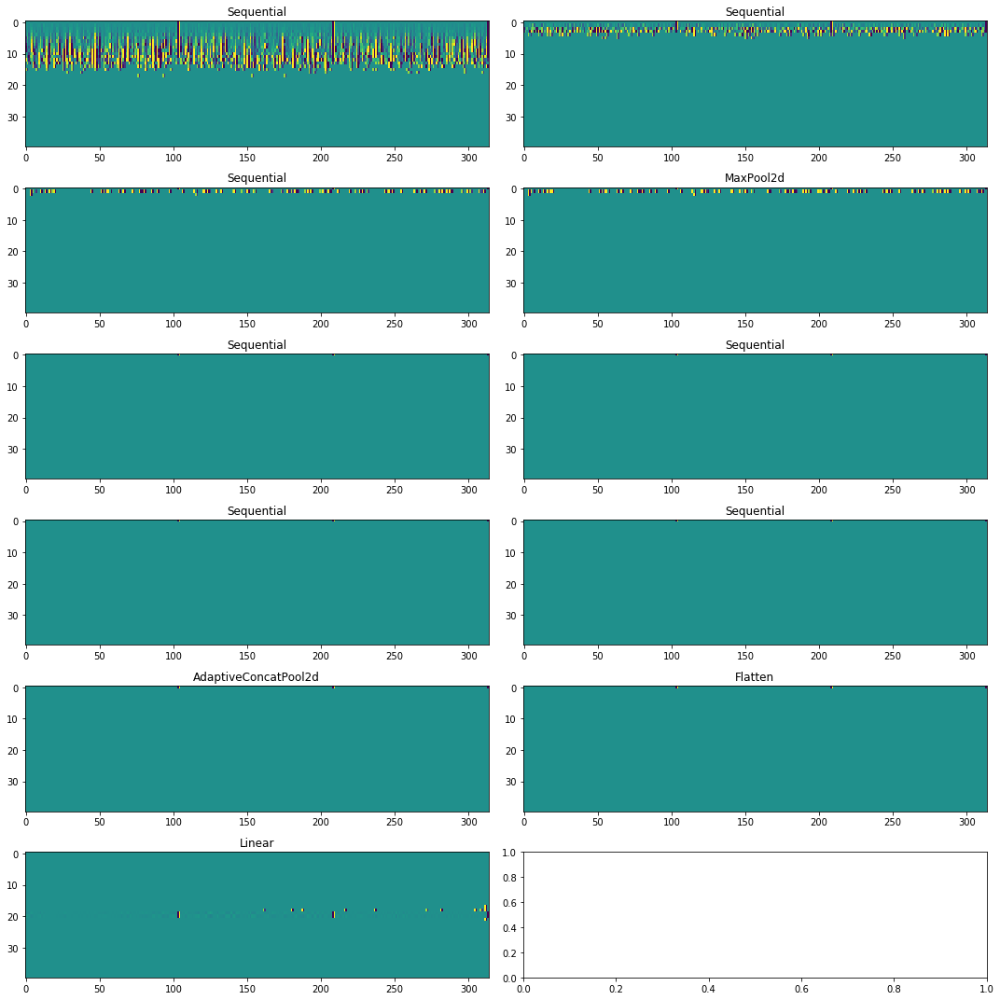

In [225]:
plot_hooks_hist_diffs(hooks_freeze_non_bn_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_freeze_non_bn_diffs.png',model=learn.model)

Between batch weight changes

In [226]:
hooks_freeze_non_bn_bb_diffs=delta_bb_hists(hooks_freeze_non_bn)

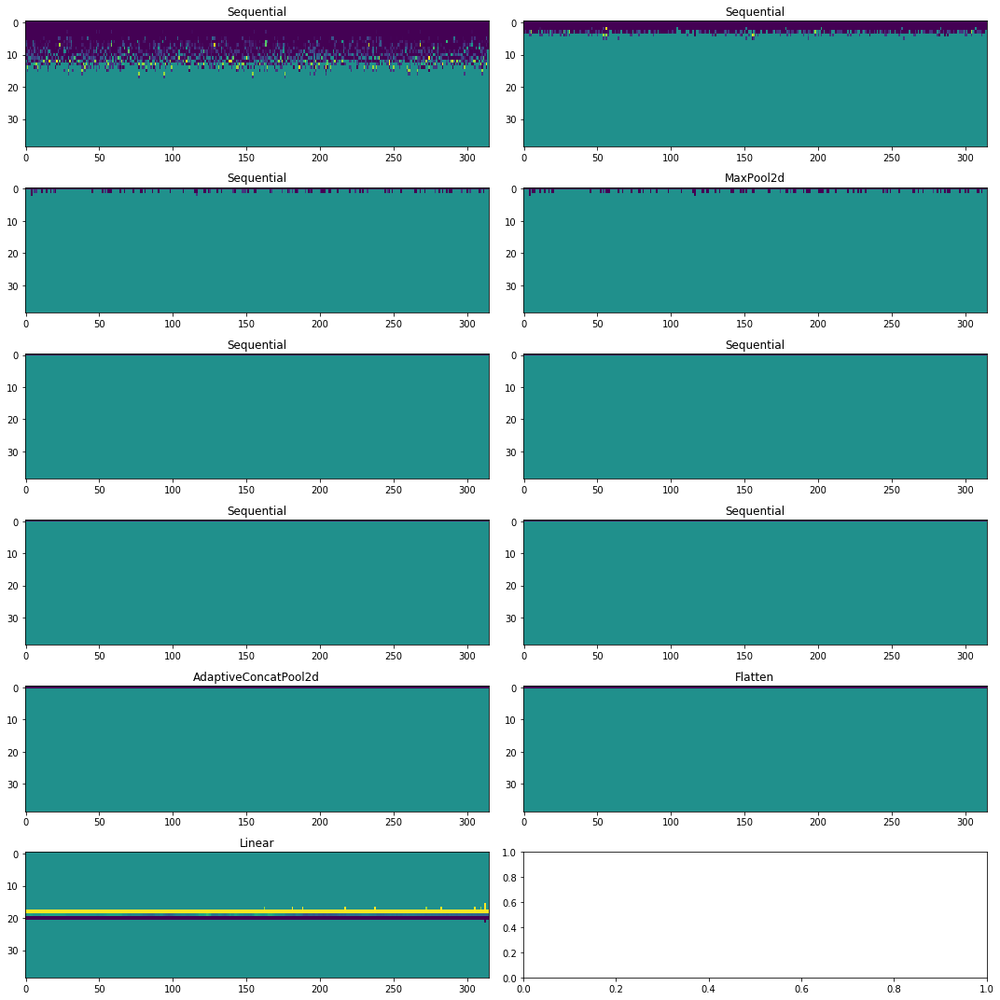

In [227]:
plot_hooks_hist_diffs(hooks_freeze_non_bn_bb_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_freeze_non_bn_bb_diffs.png',model=learn.model)

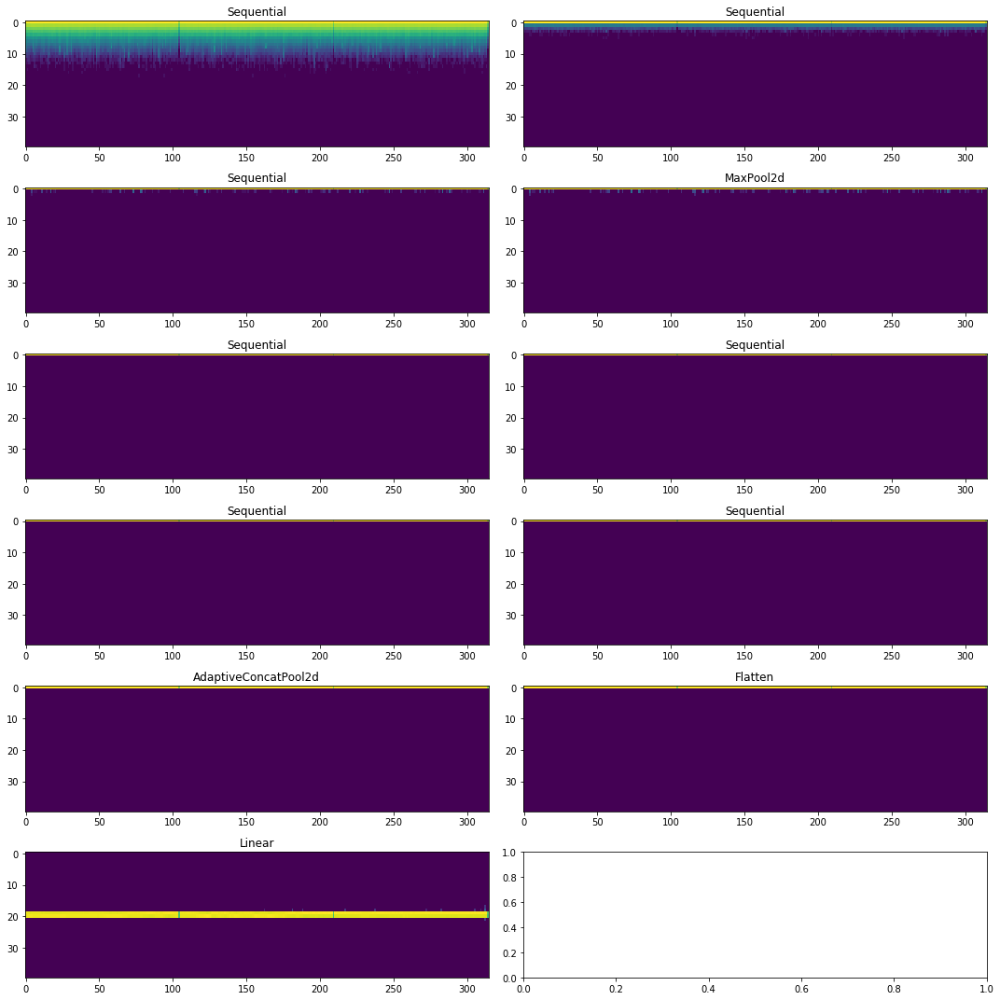

In [228]:
plot_hooks_hist(hooks_freeze_non_bn,fig_name='freeze_non_bn_hist.png',model=learn.model)

In [229]:
freeze_non_bn_del_ms,freeze_non_bn_del_sds,freeze_non_bn_del_hists =diff_stats(hooks_freeze_non_bn)

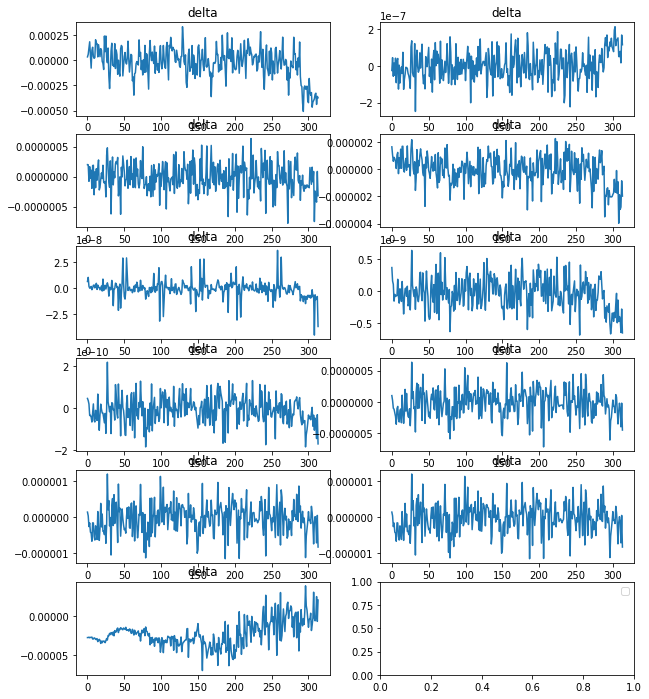

In [230]:
plot_deltas(freeze_non_bn_del_ms, 50,fig_name='freeze_non_bn_del_ms.png')

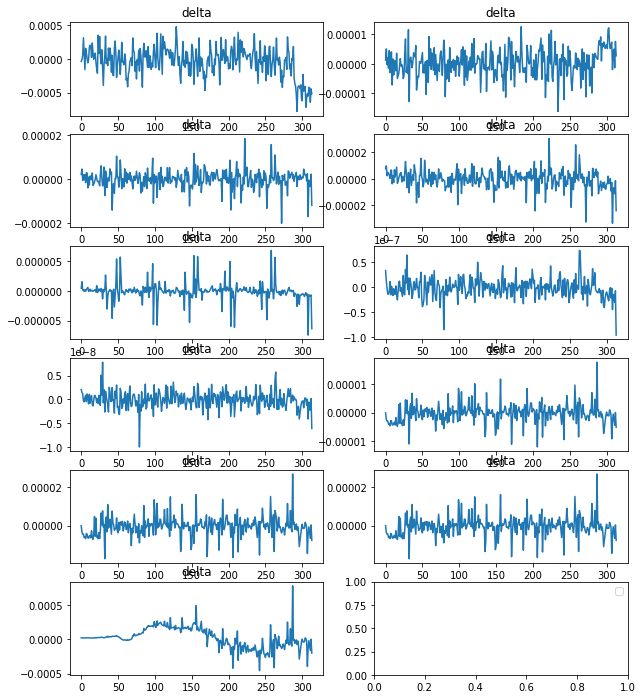

In [231]:
plot_deltas(freeze_non_bn_del_sds, 50,fig_name='freeze_non_bn_del_sds.png')

In [232]:
#freeze_non_bn_del_hists=np.vstack(freeze_non_bn_del_hists)

In [233]:
#plot_deltas(freeze_non_bn_del_hists, 50,fig_name='freeze_non_bn_del_hists.png')

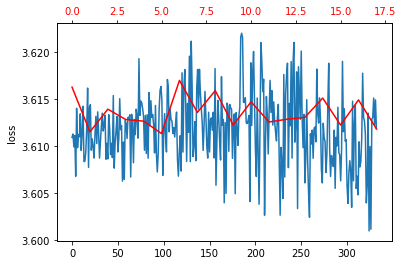

In [234]:
if REFIT:
    learn.recorder.plot_loss(save_path=IMG_PATH+'/'+NAME+'_bn_freeze_loss.png')

#### Unfreeze

In [235]:
apply_mod(learn.model, partial(set_grad, b=True))

In [236]:
if REFIT:
    with Hooks(learn.model, append_hist_rebinned_stats) as hooks_unfreeze_non_bn: 
        learn.fit(5, cbsched, reset_opt=True)
    hooks_unfreeze_non_bn_grad_rebinned=learn.grad_rebinned
    if SAVE_COMPRESSED_WTS:
        np.save(f'{HOOK_PATH}/hooks_unfreeze_non_bn.npy', hooks_unfreeze_non_bn)
        np.save(f'{HOOK_PATH}/hooks_unfreeze_non_bn_grad_rebinned', learn.grad_rebinned)
else:
    hooks_unfreeze_non_bn = np.load(f'{HOOK_PATH}/hooks_unfreeze_non_bn.npy')
    hooks_unfreeze_non_bn_grad_rebinned = np.load(f'{HOOK_PATH}/hooks_unfreeze_non_bn_grad_rebinned.npy')

epoch,train_loss,train_accuracy,valid_loss,valid_accuracy,time
0,3.606999,0.028349,3.604532,0.027663,01:17
1,3.591916,0.033448,3.583870,0.035961,01:18
2,3.582128,0.040048,3.587478,0.048409,01:18
3,3.557453,0.046948,3.559072,0.048409,01:22
4,3.535039,0.048898,3.552979,0.038728,01:19


>>1335 Recorder.begin_fit()


plotting 11 layers


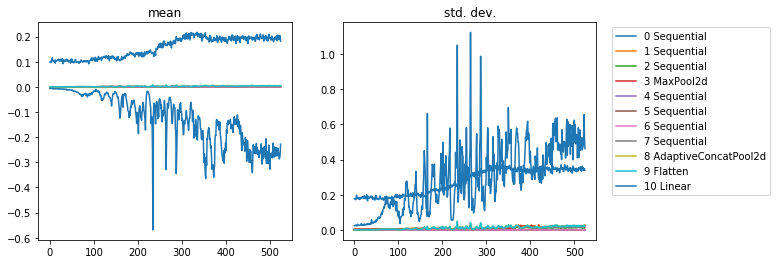

In [237]:
plot_hooks(hooks_unfreeze_non_bn,fig_name='unfreeze_non_bn_layers.png',model=learn.model)

In [238]:
h=reshape_h_data(hooks_unfreeze_non_bn)

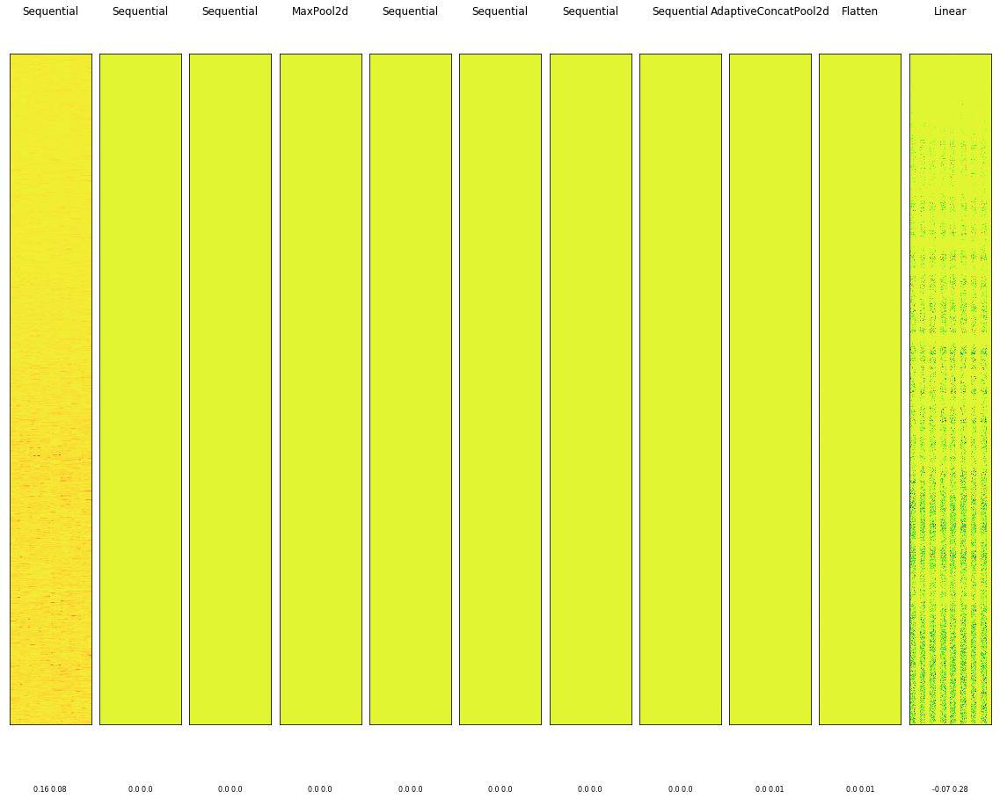

In [239]:
plot_bins(h, mod_summary, batch_max=True, scalar=0.25, cmap=plt.cm.nipy_spectral, fig_name='hooks_unfreeze_non_bn_bmax.png')

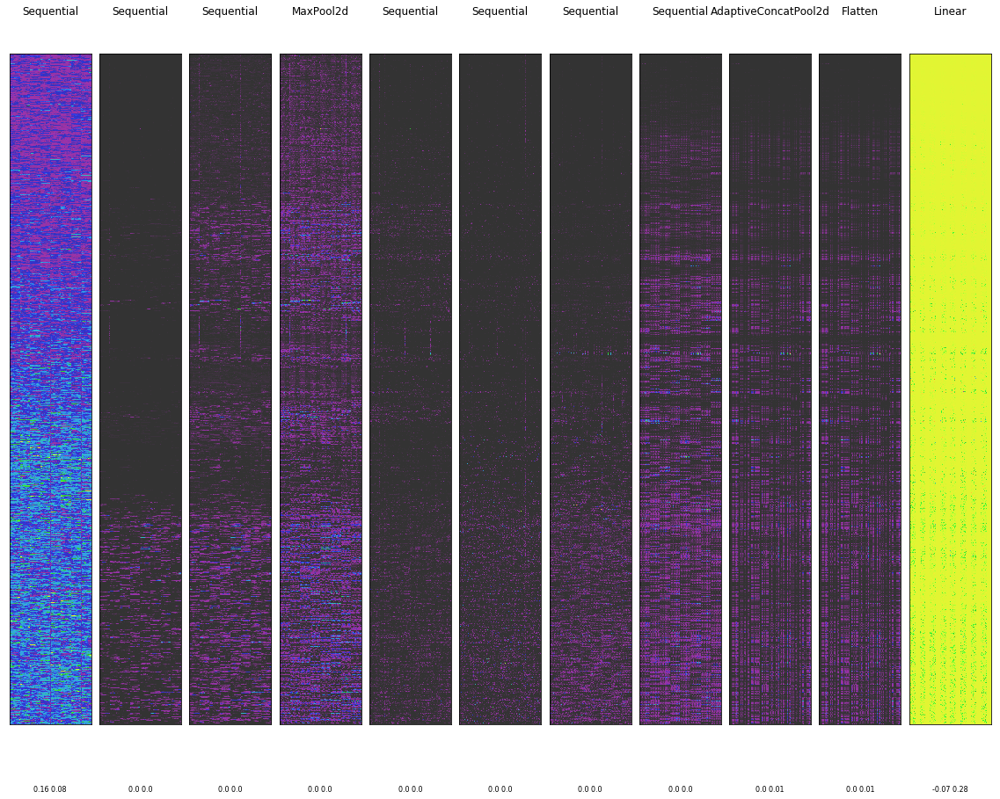

In [240]:
plot_bins(h, mod_summary, batch_max=False, scalar=0.8, cmap=plt.cm.nipy_spectral, fig_name='hooks_unfreeze_non_bn.png')

In [241]:
hooks_unfreeze_non_bn_diffs=delta_hists(hooks_unfreeze_non_bn)

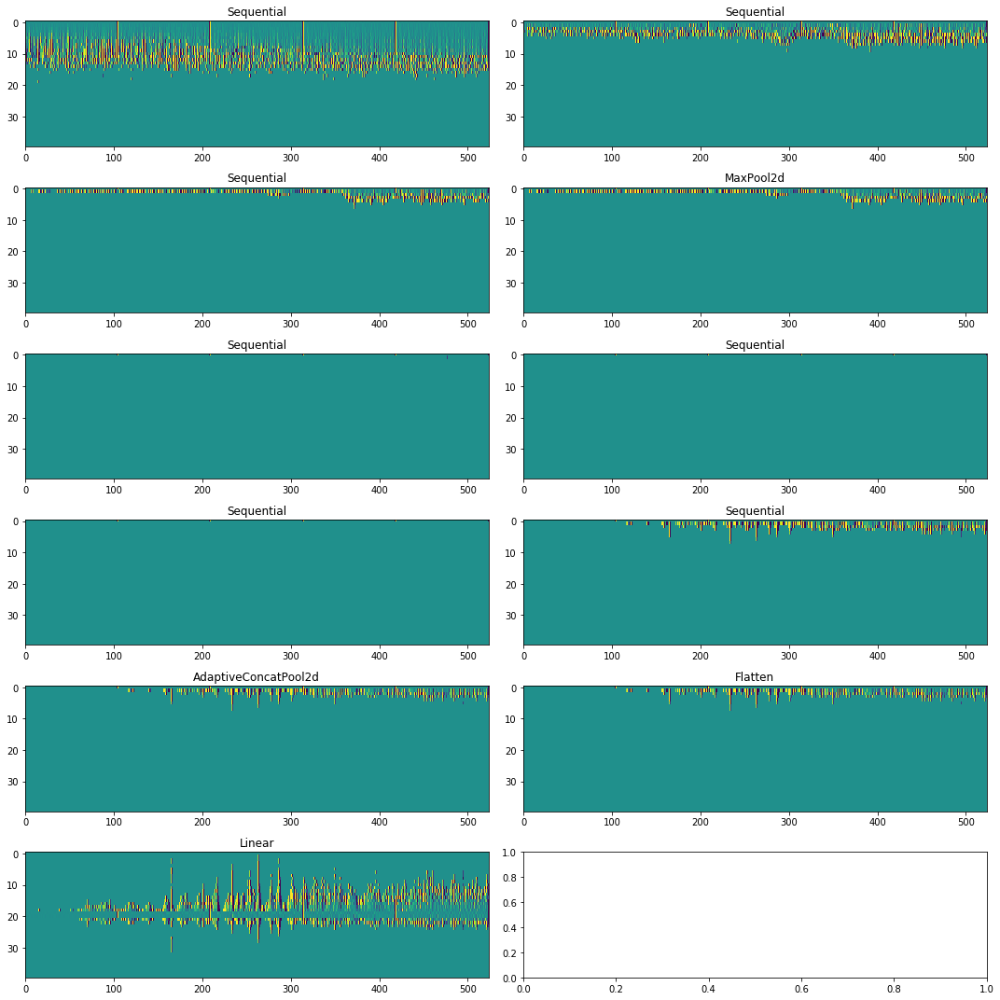

In [242]:
plot_hooks_hist_diffs(hooks_unfreeze_non_bn_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_unfreeze_non_bn_diffs.png',model=learn.model)

Between batch weight changes

In [243]:
hooks_unfreeze_non_bn_bb_diffs=delta_bb_hists(hooks_unfreeze_non_bn)

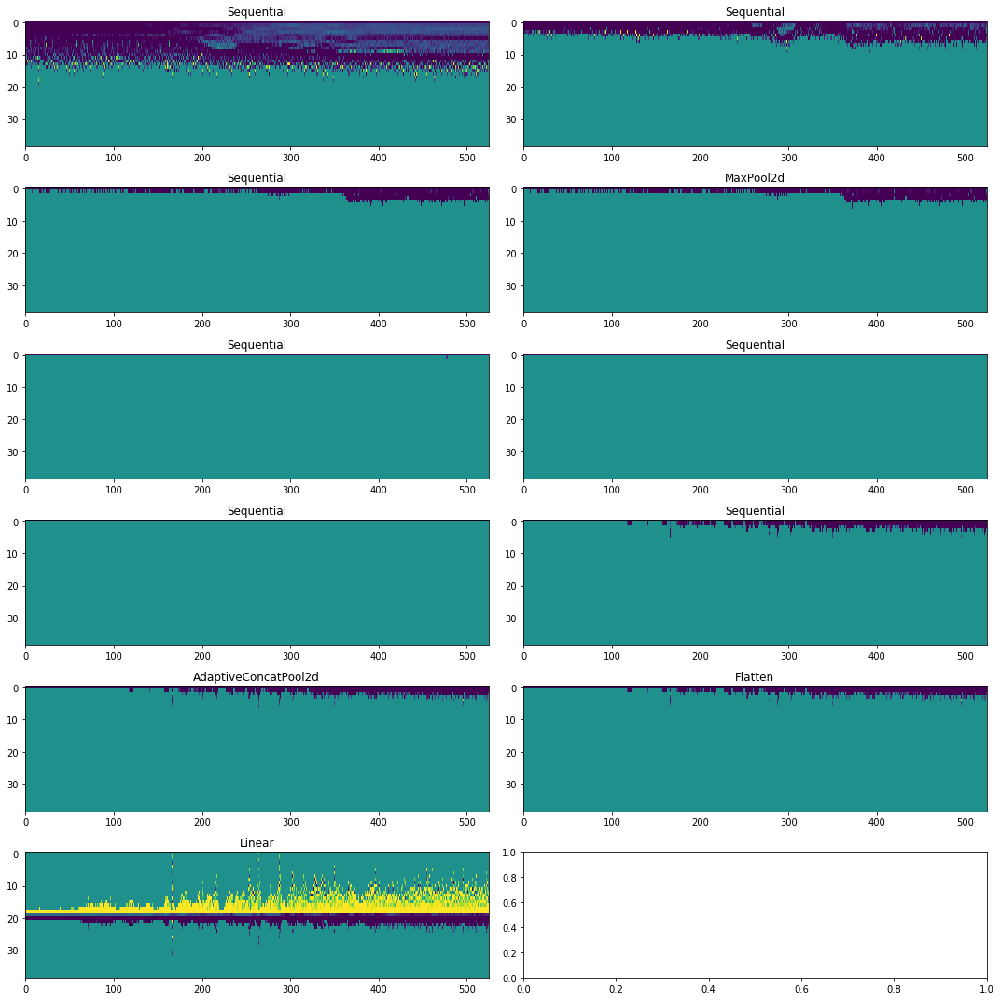

In [244]:
plot_hooks_hist_diffs(hooks_unfreeze_non_bn_bb_diffs, cmap=plt.cm.viridis, norm=True, fig_name='hooks_unfreeze_non_bn_bb_diffs.png',model=learn.model)

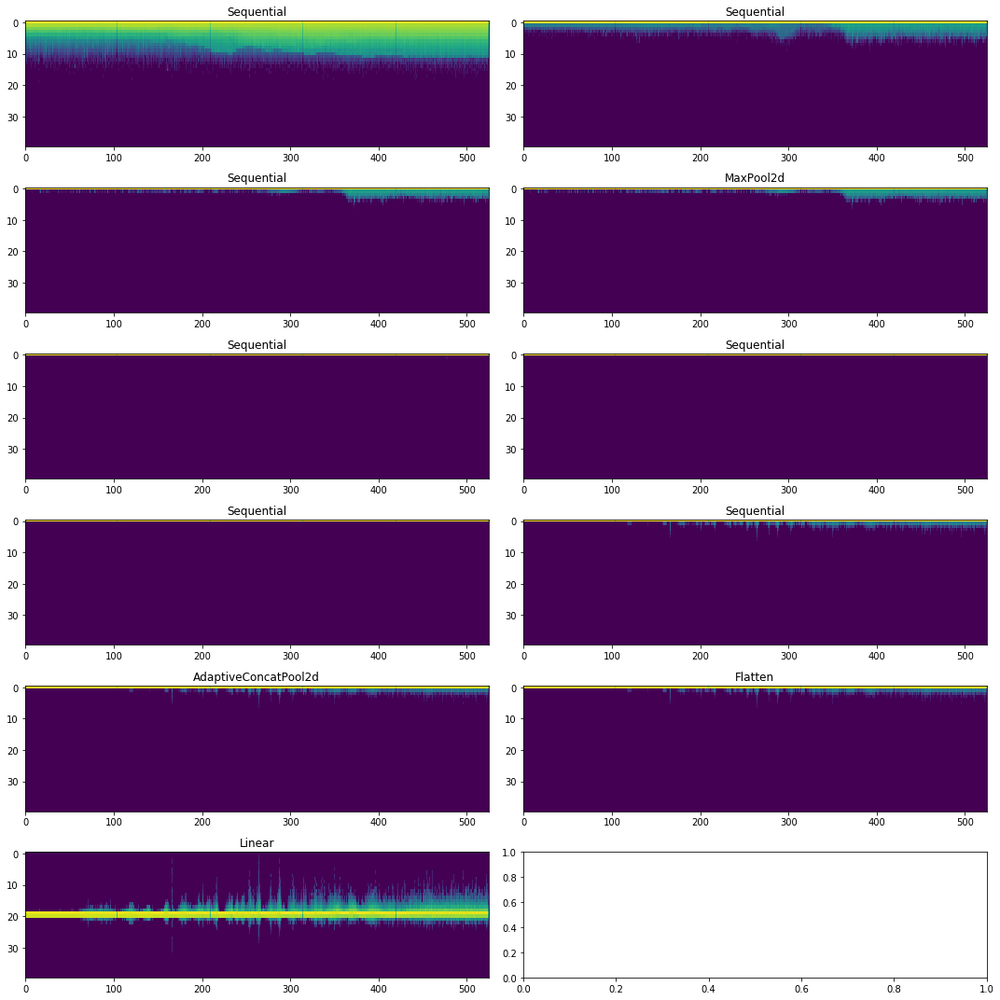

In [245]:
plot_hooks_hist(hooks_unfreeze_non_bn,fig_name='unfreeze_non_bn_hist.png',model=learn.model)

In [246]:
unfreeze_non_bn_del_ms,unfreeze_non_bn_del_sds,unfreeze_non_bn_del_hists=diff_stats(hooks_unfreeze_non_bn)

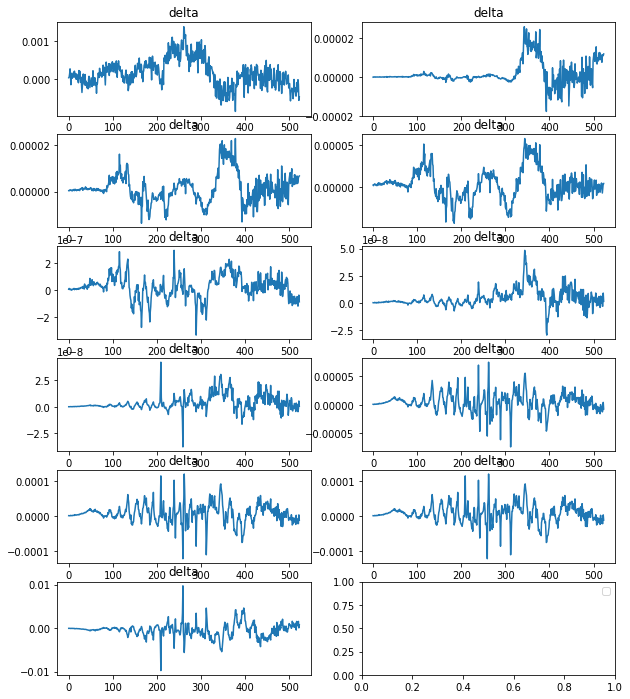

In [247]:
plot_deltas(unfreeze_non_bn_del_ms, 50,fig_name='unfreeze_non_bn_del_ms.png')

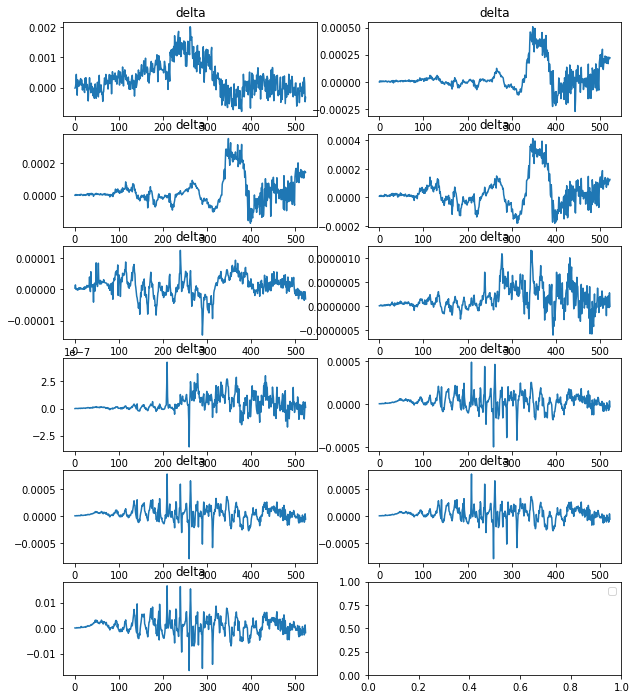

In [248]:
plot_deltas(unfreeze_non_bn_del_sds, 50,fig_name='unfreeze_non_bn_del_sds.png')

In [249]:
#unfreeze_non_bn_del_hists=np.vstack(unfreeze_non_bn_del_hists)

In [250]:
#plot_deltas(unfreeze_non_bn_del_hists, 50,fig_name='unfreeze_non_bn_del_hists.png')

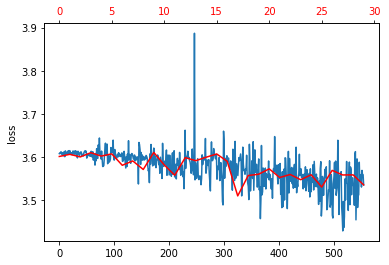

In [251]:
if REFIT:
    learn.recorder.plot_loss(save_path=IMG_PATH+'/'+NAME+'_bn_unfreeze_loss.png')

Pytorch already has an `apply` method we can use:

In [ ]:
learn.model.apply(partial(set_grad, b=False));

Lesson 12 video: 1:29

## Discriminative LR and param groups

In [ ]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func, c_out=10, norm=norm_imagenette)

In [ ]:
learn.model.load_state_dict(torch.load(mdl_path/'iw5'))


In [ ]:
len(learn.model)

In [ ]:
adapt_simple_model(learn, data)

In [ ]:
len(learn.model)

In [ ]:
def bn_splitter(m):
    def _bn_splitter(l, g1, g2):
        if isinstance(l, nn.BatchNorm2d): 
            g2 += l.parameters()
        elif hasattr(l, 'weight'): 
            g1 += l.parameters()
        for ll in l.children(): 
            _bn_splitter(ll, g1, g2)
        
    g1,g2 = [],[]
    _bn_splitter(m[0], g1, g2)
    
    g2 += m[1:].parameters()
    return g1,g2

In [ ]:
m = learn.model

In [ ]:
a,b = bn_splitter(m)

In [ ]:
len(a)

In [ ]:
len(list(m.parameters()))

In [ ]:
test_eq(len(a)+len(b), len(list(m.parameters())))

In [ ]:
Learner.ALL_CBS

In [ ]:
#export
from types import SimpleNamespace
cb_types = SimpleNamespace(**{o:o for o in Learner.ALL_CBS})

In [ ]:
cb_types.after_backward

In [ ]:
#export
class DebugCallback(Callback):
    _order = 999
    def __init__(self, cb_name, f=None): self.cb_name,self.f = cb_name,f
    def __call__(self, cb_name):
        if cb_name==self.cb_name:
            if self.f: self.f(self.run)
            else:      set_trace()

In [ ]:
#export
def sched_1cycle(lrs, pct_start=0.3, mom_start=0.95, mom_mid=0.85, mom_end=0.95):
    phases = create_phases(pct_start)
    sched_lr  = [combine_scheds(phases, cos_1cycle_anneal(lr/10., lr, lr/1e5))
                 for lr in lrs]
    sched_mom = combine_scheds(phases, cos_1cycle_anneal(mom_start, mom_mid, mom_end))
    return [ParamScheduler('lr', sched_lr),
            ParamScheduler('mom', sched_mom)]

In [ ]:
disc_lr_sched = sched_1cycle([0,3e-2], 0.5)

In [ ]:
learn = cnn_learner(nbnresnet18, data, loss_func, opt_func,
                    c_out=10, norm=norm_imagenette, splitter=bn_splitter)

learn.model.load_state_dict(torch.load(mdl_path/'iw5'))
adapt_model(learn, data)

In [ ]:
def _print_det(o): 
    print (len(o.opt.param_groups), o.opt.hypers)
    raise CancelTrainException()

if REFIT:
    learn.fit(1, disc_lr_sched + [DebugCallback(cb_types.after_batch, _print_det)])

In [ ]:
if REFIT:
    learn.fit(3, disc_lr_sched)

In [ ]:
disc_lr_sched = sched_1cycle([1e-3,1e-2], 0.3)

In [ ]:
if REFIT:
    learn.fit(1, disc_lr_sched)

## Export

In [ ]:
#!./notebook2script.py 11a_transfer_learning.ipynb

## Plots